Text(0.5, 1.0, 'Imagen BGR')

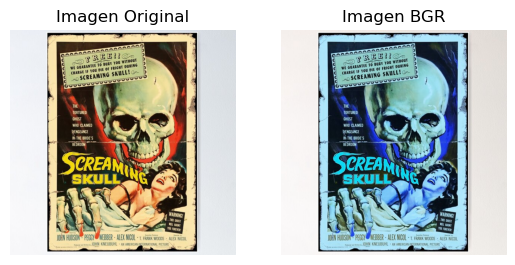

In [1]:
import cv2 as cv
import matplotlib.pyplot as plt

# Cargar la imagen
img = cv.imread('movie.jpg')

# Convertir la imagen de BGR a RGB (OpenCV usa BGR por defecto)
imgRGB = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Mostrar la primera imagen (original)
plt.subplot(1, 2, 1)  # (filas, columnas, índice de la imagen)
plt.imshow(imgRGB)
plt.axis('off')  # Opcional: quitar los ejes
plt.title('Imagen Original')

# Mostrar la segunda imagen (formato de color utilizado de forma predeterminada en OpenCV)
plt.subplot(1, 2, 2)  # (filas, columnas, índice de la imagen)
plt.imshow(img)
plt.axis('off')  # Opcional: quitar los ejes
plt.title('Imagen BGR')

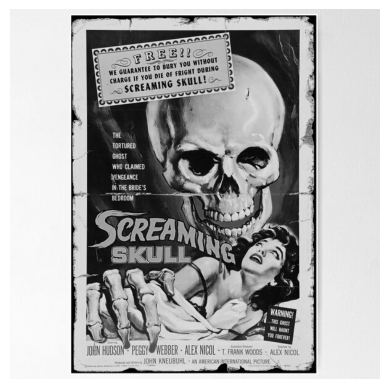

In [2]:
# Convierte la imagen de formato BGR a escala de grises (GRAY) usando OpenCV
gray = cv.cvtColor(imgRGB, cv.COLOR_BGR2GRAY)

# Mostrar la imagen usando Matplotlib
plt.imshow(gray, cmap='gray')
plt.axis('off')  # Opcional: para quitar los ejes
plt.show()

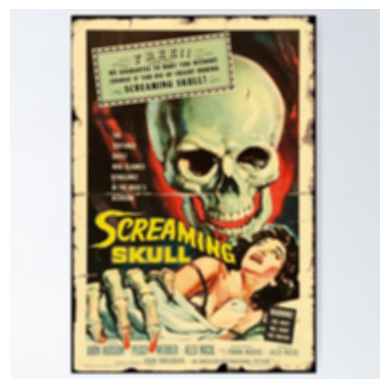

In [3]:
# Aplica un desenfoque gaussiano a la imagen con un kernel de tamaño 7x7
# (7, 7) es el tamaño del kernel, que especifica el tamaño de la matriz de píxeles sobre la cual se calcula el promedio ponderado.
# Lo que significa que la imagen será suavizada considerando un área de 7 píxeles en cada dirección.
# El parámetro cv.BORDER_DEFAULT define cómo manejar los bordes durante el desenfoque
blur = cv.GaussianBlur(imgRGB, (7,7), cv.BORDER_DEFAULT)

# Mostrar la imagen usando Matplotlib
plt.imshow(blur)
plt.axis('off')
plt.show()

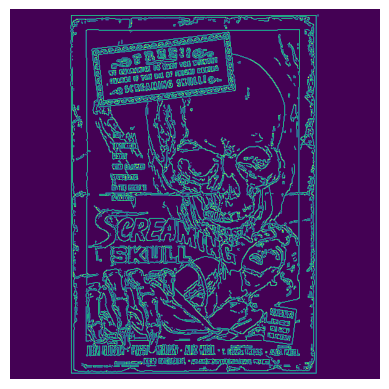

In [4]:
# Aplica el detector de bordes Canny a la imagen desenfocada (blur) con umbrales de 125 y 175
# Los bordes detectados por el algoritmo estarán en el rango entre estos dos umbrales. 
# Si el gradiente de un píxel es mayor que el umbral superior, se considera parte de un borde fuerte, 
# mientras que si es menor que el umbral inferior, no se considera un borde. 
canny = cv.Canny(imgRGB, 125, 175)

# Mostrar la imagen usando Matplotlib
plt.imshow(canny)
plt.axis('off')
plt.show()

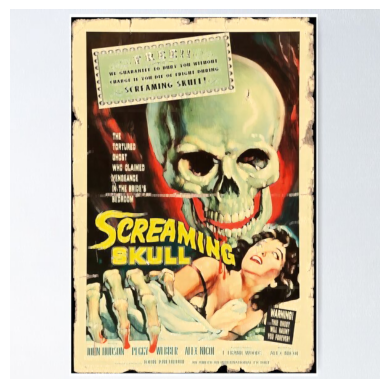

In [5]:
# (7, 7) es el tamaño del kernel, que define el área alrededor de cada píxel en la que se aplica la dilatación. 
# Un kernel de 7x7 es relativamente grande, lo que significa que los bordes serán muy amplificados.
# iterations=3 significa que la dilatación se repetirá 3 veces. Cuantas más iteraciones, 
# más se expanden los bordes, haciendo que sean más visibles o más gruesos.
dilated = cv.dilate(imgRGB, (7,7), iterations=3)

# Mostrar la imagen usando Matplotlib
plt.imshow(dilated)
plt.axis('off')
plt.show()

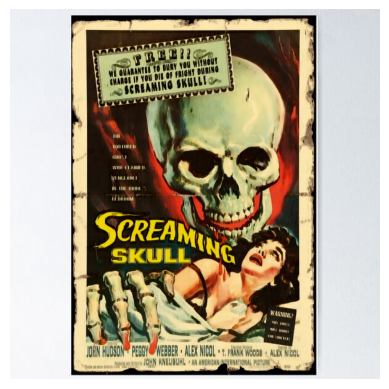

In [6]:
eroded = cv.erode(imgRGB, (7,7), iterations=3)

# Mostrar la imagen usando Matplotlib
plt.imshow(eroded)
plt.axis('off')
plt.show()

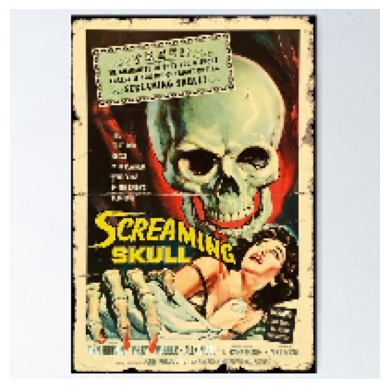

In [7]:
# cv.resize() redimensiona la imagen a un nuevo tamaño.
# El segundo parámetro (200, 200) especifica el nuevo tamaño de la imagen en píxeles (ancho, alto).
# 'interpolation=cv.INTER_CUBIC' define el algoritmo de interpolación utilizado para el redimensionamiento:
#   - INTER_CUBIC: Utiliza interpolación cúbica, que es un método de interpolación de alta calidad.
#     Este método usa los 16 píxeles más cercanos para calcular el nuevo valor de cada píxel, lo que da lugar a imágenes más suaves.
resized = cv.resize(imgRGB, (200,200), interpolation=cv.INTER_CUBIC)

# Mostrar la imagen usando Matplotlib
plt.imshow(resized)
plt.axis('off')  # Opcional: para quitar los ejes
plt.show()

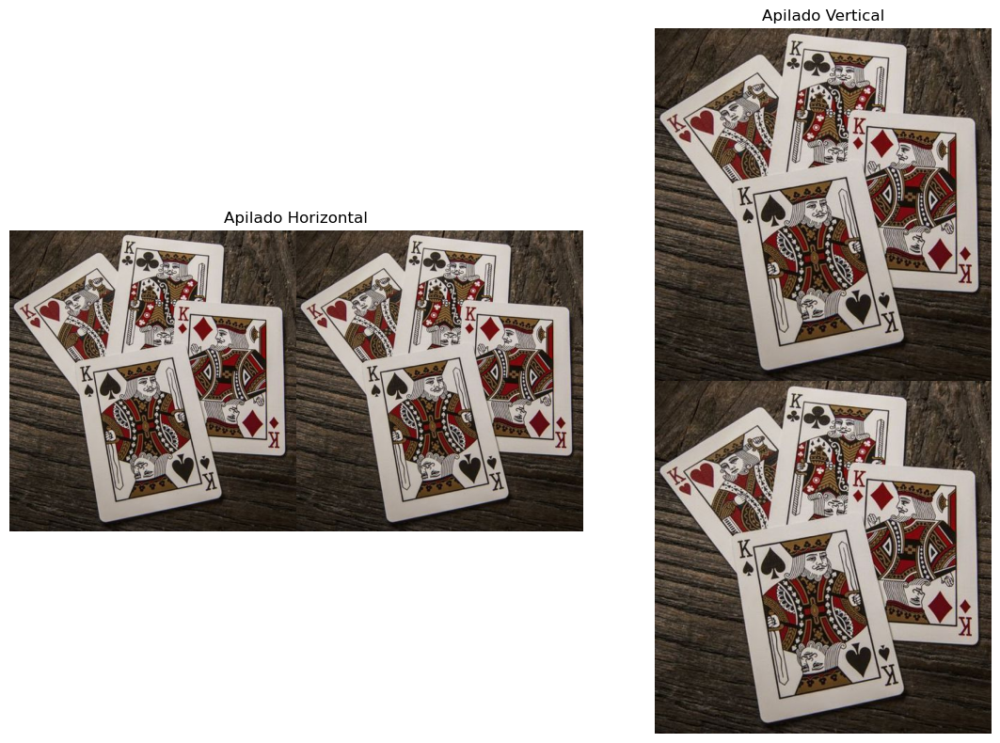

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Leer la imagen desde el archivo
img = cv2.imread('cards.jpg')

# Convertir la imagen a escala de grises
imgGray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apilar imágenes horizontalmente (usar directamente NumPy para unir las imágenes)
imgHor = np.hstack((img, img))

# Apilar imágenes verticalmente
imgVer = np.vstack((img, img))

# Convertir las imágenes al espacio de color RGB para mostrarlas con Matplotlib
imgHor_rgb = cv2.cvtColor(imgHor, cv2.COLOR_BGR2RGB)
imgVer_rgb = cv2.cvtColor(imgVer, cv2.COLOR_BGR2RGB)

# Mostrar las imágenes con Matplotlib
plt.figure(figsize=(12, 8))  # Configurar tamaño de la figura

# Mostrar las imágenes apiladas horizontalmente
plt.subplot(1, 2, 1)
plt.imshow(imgHor_rgb)
plt.title("Apilado Horizontal")
plt.axis("off")  # Ocultar ejes

# Mostrar las imágenes apiladas verticalmente
plt.subplot(1, 2, 2)
plt.imshow(imgVer_rgb)
plt.title("Apilado Vertical")
plt.axis("off")


# Ajustar el diseño y mostrar
plt.tight_layout()
plt.show()


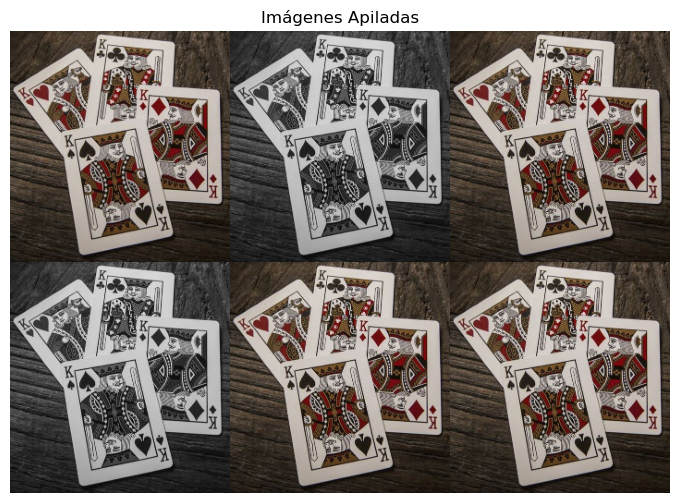

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Función para apilar imágenes en una sola matriz visual
def stackImages(scale, imgArray):
    """
    Apila imágenes en una cuadrícula ajustada al tamaño de la primera imagen.
    - scale: Factor de escala para redimensionar las imágenes.
    - imgArray: Arreglo bidimensional que contiene las imágenes a apilar.
    """
    rows = len(imgArray)  # Número de filas en el arreglo
    cols = len(imgArray[0])  # Número de columnas en el arreglo
    rowsAvailable = isinstance(imgArray[0], list)  # Verifica si es un arreglo 2D
    width = imgArray[0][0].shape[1]  # Ancho de la primera imagen
    height = imgArray[0][0].shape[0]  # Alto de la primera imagen

    if rowsAvailable:
        # Procesar un arreglo 2D de imágenes
        for x in range(rows):
            for y in range(cols):
                # Redimensionar imágenes para que coincidan en tamaño
                if imgArray[x][y].shape[:2] == imgArray[0][0].shape[:2]:
                    imgArray[x][y] = cv2.resize(imgArray[x][y], (0, 0), None, scale, scale)
                else:
                    imgArray[x][y] = cv2.resize(
                        imgArray[x][y], 
                        (imgArray[0][0].shape[1], imgArray[0][0].shape[0]), 
                        None, 
                        scale, 
                        scale
                    )
                # Convertir imágenes en escala de grises a BGR para apilarlas
                if len(imgArray[x][y].shape) == 2: 
                    imgArray[x][y] = cv2.cvtColor(imgArray[x][y], cv2.COLOR_GRAY2BGR)
        
        # Crear imágenes vacías para rellenar si es necesario
        imageBlank = np.zeros((height, width, 3), np.uint8)
        hor = [imageBlank] * rows  # Inicializar filas horizontales
        for x in range(rows):
            hor[x] = np.hstack(imgArray[x])  # Apilar horizontalmente cada fila
        ver = np.vstack(hor)  # Apilar todas las filas verticalmente
    else:
        # Procesar un arreglo 1D de imágenes
        for x in range(rows):
            if imgArray[x].shape[:2] == imgArray[0].shape[:2]:
                imgArray[x] = cv2.resize(imgArray[x], (0, 0), None, scale, scale)
            else:
                imgArray[x] = cv2.resize(
                    imgArray[x], 
                    (imgArray[0].shape[1], imgArray[0].shape[0]), 
                    None, 
                    scale, 
                    scale
                )
            # Convertir imágenes en escala de grises a BGR para apilarlas
            if len(imgArray[x].shape) == 2: 
                imgArray[x] = cv2.cvtColor(imgArray[x], cv2.COLOR_GRAY2BGR)
        hor = np.hstack(imgArray)  # Apilar horizontalmente
        ver = hor  # No es necesario apilar verticalmente en este caso
    
    return ver

# Leer una imagen desde el archivo
img = cv2.imread('cards.jpg')

# Convertir la imagen a escala de grises
imgGray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apilar imágenes en un arreglo 2D con factor de escala 0.5
imgStack = stackImages(0.5, ([img, imgGray, img], [imgGray, img, img]))

# Convertir el resultado a formato RGB
imgStack_rgb = cv2.cvtColor(imgStack, cv2.COLOR_BGR2RGB)

# Mostrar la imagen apilada con Matplotlib
plt.figure(figsize=(10, 6)) 
plt.imshow(imgStack_rgb)  # Mostrar la imagen apilada
plt.title("Imágenes Apiladas")
plt.axis("off")
plt.show()


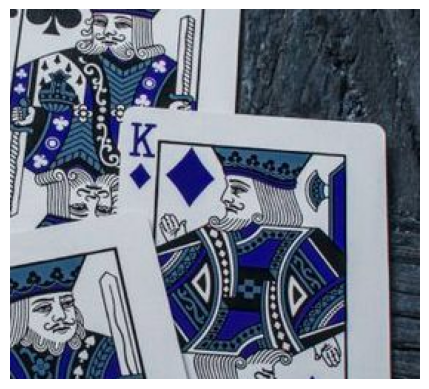

In [12]:
# Esta línea realiza un recorte (cropping) de la imagen original 'img'.
# La sintaxis 'img[filas, columnas]' se utiliza para seleccionar una porción de la imagen.
#   - El primer índice '50:100' especifica el rango de filas que se deben seleccionar, 
#     es decir, las filas de la imagen desde la fila 50 hasta la fila 99 (el valor final es exclusivo).
#   - El segundo índice '200:300' especifica las columnas de la imagen desde la columna 200 hasta la 299.
# El resultado es una nueva imagen recortada de la imagen original.
cropped = img[50:300, 200:500]

# Mostrar la imagen usando Matplotlib
plt.imshow(cropped)
plt.axis('off')
plt.show()

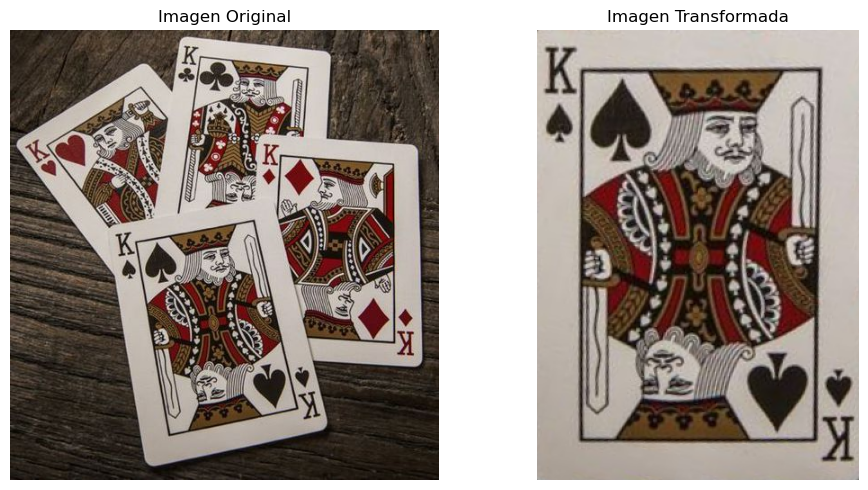

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt  # Para mostrar las imágenes con Matplotlib

# Leer la imagen desde el archivo especificado
img = cv2.imread("cards.jpg")

# Especificar el ancho y alto deseados para la transformación de perspectiva
width, height = 250, 350

# Coordenadas de los puntos en la imagen original que definen la región de interés (ROI)
# Estos puntos corresponden a las esquinas de la tarjeta en la imagen original
pts1 = np.float32([[111, 219], [287, 188], [154, 482], [352, 440]])

# Coordenadas de los puntos en la imagen destino, que representan un rectángulo en la perspectiva corregida
pts2 = np.float32([[0, 0], [width, 0], [0, height], [width, height]])

# Calcular la matriz de transformación de perspectiva
# La función `cv2.getPerspectiveTransform` genera la matriz que mapea `pts1` a `pts2`
matrix = cv2.getPerspectiveTransform(pts1, pts2)

# Aplicar la transformación de perspectiva a la imagen
# `cv2.warpPerspective` utiliza la matriz para transformar la imagen original
imgOutput = cv2.warpPerspective(img, matrix, (width, height))

# Convertir las imágenes de BGR (formato de OpenCV) a RGB (formato de Matplotlib)
# Esto es necesario porque OpenCV utiliza el formato BGR por defecto
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
imgOutput_rgb = cv2.cvtColor(imgOutput, cv2.COLOR_BGR2RGB)

# Mostrar las imágenes con Matplotlib
plt.figure(figsize=(10, 5))  # Configurar el tamaño de la figura

# Mostrar la imagen original
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title("Imagen Original")
plt.axis("off")  # Ocultar los ejes

# Mostrar la imagen transformada
plt.subplot(1, 2, 2)
plt.imshow(imgOutput_rgb)
plt.title("Imagen Transformada")
plt.axis("off")  # Ocultar los ejes

# Mostrar las imágenes en pantalla
plt.tight_layout()
plt.show()


Text(0.5, 1.0, 'Imagen Original')

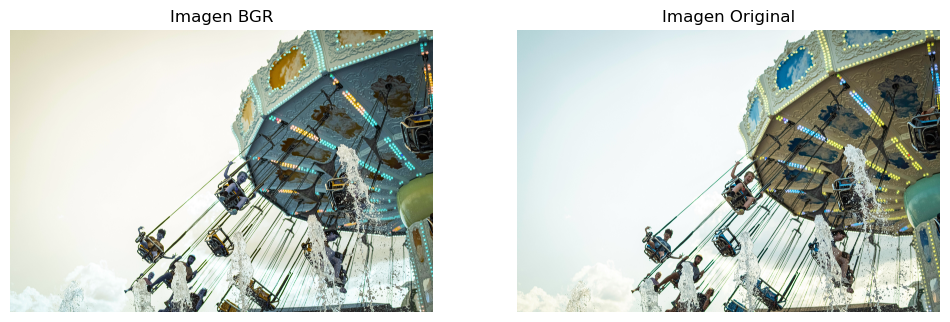

In [14]:
import cv2 as cv
import numpy as np

# Cargar la imagen desde la ruta especificada
img = cv.imread('carrusel.jpg')
# cv.imread() lee la imagen desde el archivo, el formato es BGR por defecto.

# Convertir la imagen de BGR a RGB (OpenCV usa BGR por defecto)
imgRGB = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Ajustar el tamaño de la figura para que las imágenes se vean más grandes
plt.figure(figsize=(12, 6))  # (ancho, alto) en pulgadas

# Mostrar la primera imagen (original)
plt.subplot(1, 2, 1)  # (filas, columnas, índice de la imagen)
plt.imshow(img)
plt.axis('off')
plt.title('Imagen BGR')

# Mostrar la primera imagen (original)
plt.subplot(1, 2, 2)  # (filas, columnas, índice de la imagen)
plt.imshow(imgRGB)
plt.axis('off')  # Opcional: quitar los ejes
plt.title('Imagen Original')


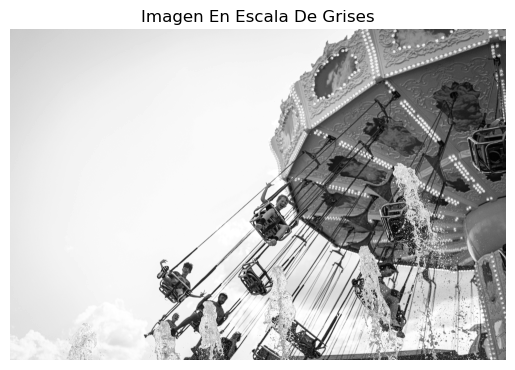

In [15]:
# Convertir la imagen original de BGR a escala de grises (un solo canal de intensidad)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
# cv.cvtColor() convierte la imagen de un espacio de color a otro. Aquí, BGR a GRAY.
# Este paso es necesario para facilitar la detección de bordes y contornos, ya que los bordes se pueden detectar 
# más fácilmente en escala de grises.

# Mostrar la imagen usando Matplotlib
plt.imshow(gray, cmap='gray')  # Usamos 'cmap="gray"' para mostrar en escala de grises
plt.axis('off')  # Opcional: para quitar los ejes
plt.title('Imagen En Escala De Grises')
plt.show()

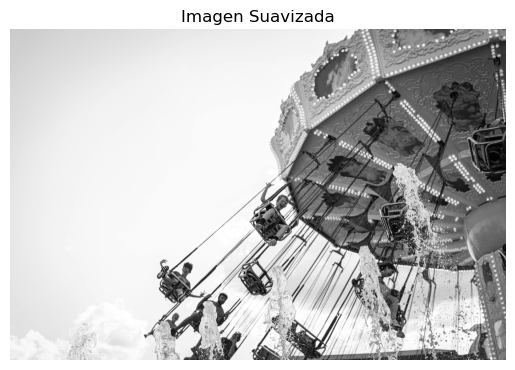

In [16]:
# Aplicar un filtro de desenfoque gaussiano a la imagen en escala de grises
blur = cv.GaussianBlur(gray, (7,7), cv.BORDER_DEFAULT)
# cv.GaussianBlur() suaviza la imagen usando un filtro gaussiano para reducir el ruido y mejorar la detección de bordes.
# El parámetro (5, 5) define el tamaño del kernel (filtro de 5x5 píxeles), y cv.BORDER_DEFAULT maneja cómo se rellenan los bordes.

# Mostrar la imagen usando Matplotlib
plt.imshow(blur, cmap='gray')  # Usamos 'cmap="gray"' para mostrar en escala de grises
plt.axis('off')  # Opcional: para quitar los ejes
plt.title('Imagen Suavizada')
plt.show()

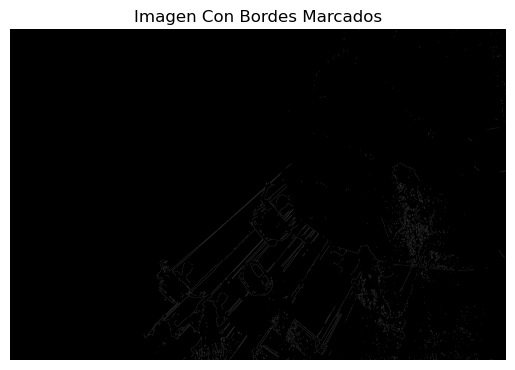

In [17]:
# Aplicar el detector de bordes Canny a la imagen desenfocada
canny = cv.Canny(blur, 150, 200)
# Canny, utiliza dos umbrales para definir los bordes:
#  - El primer umbral (125) es el límite inferior.
#  - El segundo umbral (175) es el límite superior.
# Si el valor del gradiente es superior al umbral superior, el píxel es considerado un borde fuerte.
# Si está por debajo del umbral inferior, se descarta.
# Los valores intermedios se validan si están conectados a un borde fuerte.

# Mostrar la imagen usando Matplotlib
plt.imshow(canny, cmap='gray')  # Usamos 'cmap="gray"' para mostrar en escala de grises
plt.axis('off')  # Opcional: para quitar los ejes
plt.title('Imagen Con Bordes Marcados')
plt.show()

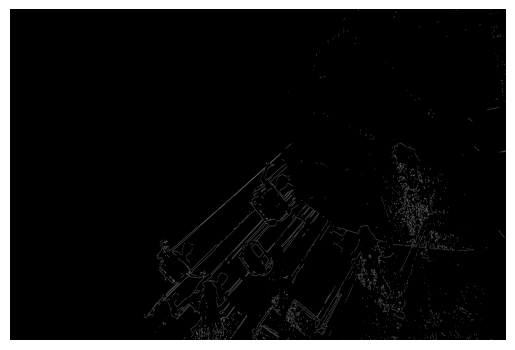

In [18]:
# (7, 7) es el tamaño del kernel, que define el área alrededor de cada píxel en la que se aplica la dilatación. 
# Un kernel de 7x7 es relativamente grande, lo que significa que los bordes serán muy amplificados.
# iterations=2 significa que la dilatación se repetirá 2 veces. Cuantas más iteraciones, 
# más se expanden los bordes, haciendo que sean más visibles o más gruesos.
dilated = cv.dilate(canny, (7, 7), iterations=2)

# Mostrar la imagen usando Matplotlib
plt.imshow(dilated, cmap='gray')  # Usamos 'cmap="gray"' para mostrar en escala de grises
plt.axis('off')  # Opcional: para quitar los ejes
plt.show()

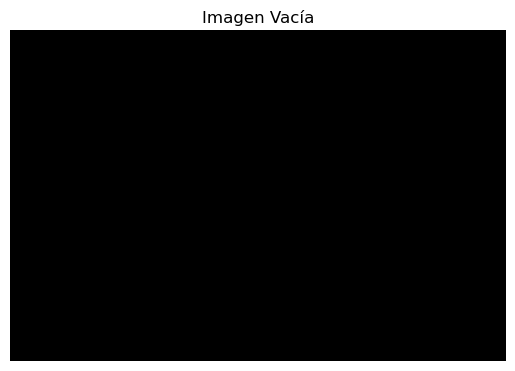

In [19]:
# Crear una imagen en blanco (negra) del mismo tamaño que la imagen original
blank = np.zeros(img.shape, dtype='uint8')
# np.zeros() crea una matriz de ceros del mismo tamaño que img, con tipo de dato uint8 (8-bit sin signo)
# Esto es útil para dibujar contornos u otras operaciones sin alterar la imagen original.

# Mostrar la imagen vacía.
plt.axis('off')
plt.title('Imagen Vacía')
plt.imshow(blank)

3877 contour(s) found!


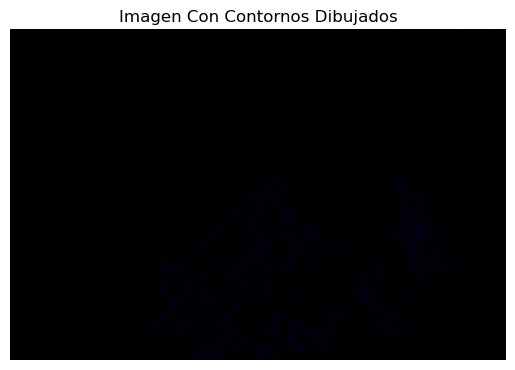

In [20]:


# Encontrar contornos en la imagen con bordes detectados (Canny)
contours, hierarchies = cv.findContours(canny, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
# cv.findContours() detecta los contornos en la imagen binaria (bordes detectados por Canny).
# cv.RETR_LIST: Recupera todos los contornos sin establecer una jerarquía.
# cv.CHAIN_APPROX_SIMPLE: Usa una aproximación simple para los contornos, reduciendo el número de puntos.
print(f'{len(contours)} contour(s) found!')  # Imprime el número de contornos encontrados

# Dibujar los contornos encontrados sobre la imagen en blanco (vacía)
cv.drawContours(blank, contours, -1, (0,0,255), 1)
# cv.drawContours() dibuja los contornos encontrados sobre la imagen en blanco.
# El parámetro -1 indica que se dibujarán todos los contornos.
# (0, 0, 255) es el color del contorno (rojo en formato BGR).
# El valor 1 es el grosor de las líneas que componen los contornos.

#cv.imshow('Contours Drawn', blank)  # Muestra la imagen con los contornos dibujados

# Mostrar la imagen usando Matplotlib
plt.imshow(blank)
plt.axis('off')
plt.title('Imagen Con Contornos Dibujados')
plt.show()

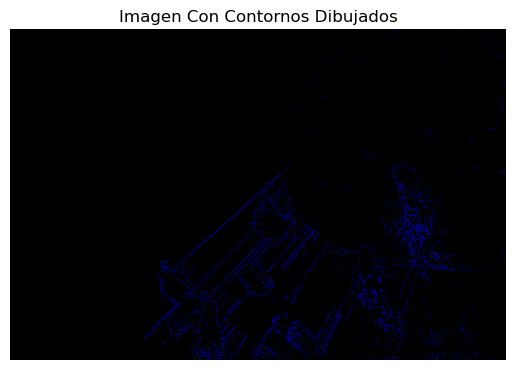

In [21]:
# Dibujar los contornos encontrados sobre la imagen en blanco (vacía)
cv.drawContours(blank, contours, -1, (0,0,255), 3)
# cv.drawContours() dibuja los contornos encontrados sobre la imagen en blanco.
# El parámetro -1 indica que se dibujarán todos los contornos.
# (0, 0, 255) es el color del contorno (rojo en formato BGR).
# El valor 1 es el grosor de las líneas que componen los contornos.

# Mostrar la imagen usando Matplotlib
plt.imshow(blank)
plt.axis('off')
plt.title('Imagen Con Contornos Dibujados')
plt.show()

3877 contour(s) found!


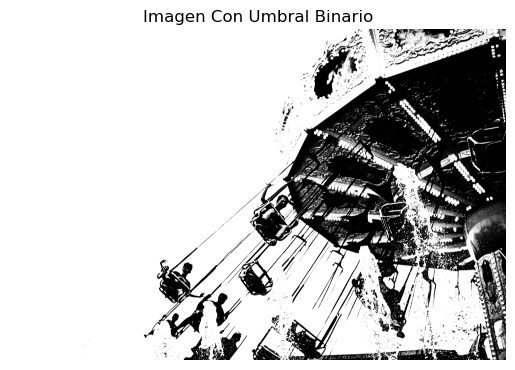

In [22]:
# Cargar la imagen desde la ruta especificada
img = cv.imread('carrusel.jpg')
# cv.imread() lee la imagen desde el archivo, el formato es BGR por defecto.

# Convertir la imagen original de BGR a escala de grises (un solo canal de intensidad)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Encontrar contornos en la imagen con bordes detectados
ret, thresh = cv.threshold(gray, 125, 255, cv.THRESH_BINARY)

countours, hierarchies = cv.findContours(thresh, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
# cv.findContours() detecta los contornos en la imagen binaria.
print(f'{len(contours)} contour(s) found!')  # Imprime el número de contornos encontrados

# Mostrar la imagen usando Matplotlib
plt.imshow(thresh, cmap='gray')
plt.title('Imagen Con Umbral Binario')
plt.axis('off')
plt.show()

3877 contour(s) found!


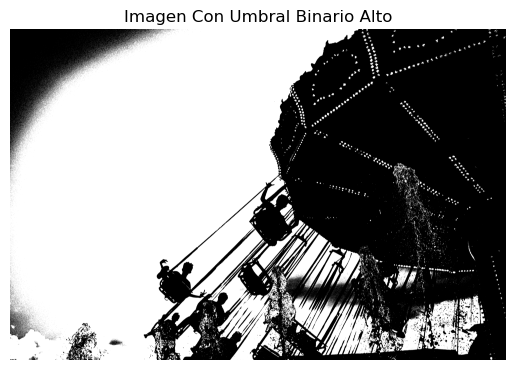

In [23]:
# Cargar la imagen desde la ruta especificada
img = cv.imread('carrusel.jpg')
# cv.imread() lee la imagen desde el archivo, el formato es BGR por defecto.

# Convertir la imagen original de BGR a escala de grises (un solo canal de intensidad)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Encontrar contornos en la imagen con bordes detectados
ret, thresh = cv.threshold(gray, 225, 250, cv.THRESH_BINARY)

countours, hierarchies = cv.findContours(thresh, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
# cv.findContours() detecta los contornos en la imagen binaria.
print(f'{len(contours)} contour(s) found!')  # Imprime el número de contornos encontrados

# Mostrar la imagen usando Matplotlib
plt.imshow(thresh, cmap='gray')
plt.title('Imagen Con Umbral Binario Alto')
plt.axis('off')
plt.show()

3877 contour(s) found!


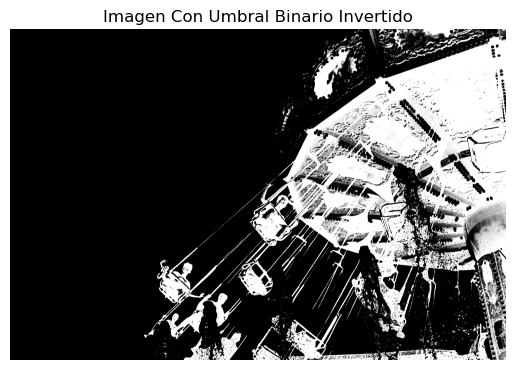

In [24]:
# Cargar la imagen desde la ruta especificada
img = cv.imread('carrusel.jpg')
# cv.imread() lee la imagen desde el archivo, el formato es BGR por defecto.

# Convertir la imagen original de BGR a escala de grises (un solo canal de intensidad)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Encontrar contornos en la imagen con bordes invertidos
ret, thresh = cv.threshold(gray, 120, 220, cv.THRESH_BINARY_INV)

countours, hierarchies = cv.findContours(thresh, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
# cv.findContours() detecta los contornos en la imagen binaria.
print(f'{len(contours)} contour(s) found!')  # Imprime el número de contornos encontrados

# Mostrar la imagen usando Matplotlib
plt.imshow(thresh, cmap='gray')
plt.title('Imagen Con Umbral Binario Invertido')
plt.axis('off')
plt.show()

3877 contour(s) found!


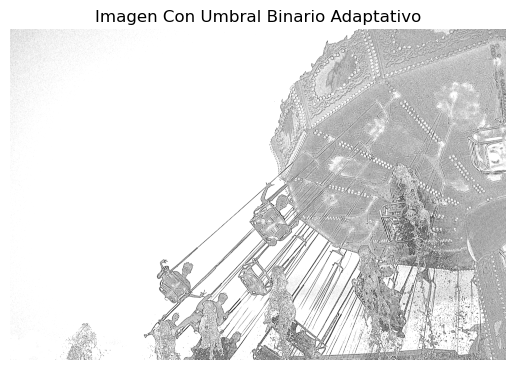

In [25]:
# Cargar la imagen desde la ruta especificada
img = cv.imread('carrusel.jpg')
# cv.imread() lee la imagen desde el archivo, el formato es BGR por defecto.

# Convertir la imagen original de BGR a escala de grises (un solo canal de intensidad)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Encontrar contornos en la imagen con bordes invertidos
adaptative_thresh = cv.adaptiveThreshold(gray, 255, cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY, 11, 7)

countours, hierarchies = cv.findContours(thresh, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
# cv.findContours() detecta los contornos en la imagen binaria.
print(f'{len(contours)} contour(s) found!')  # Imprime el número de contornos encontrados

# Mostrar la imagen usando Matplotlib
plt.imshow(adaptative_thresh, cmap='gray')
plt.title('Imagen Con Umbral Binario Adaptativo')
plt.axis('off')
plt.show()

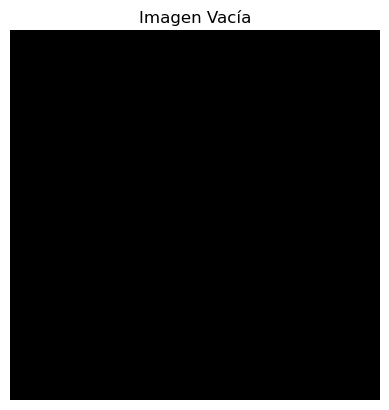

In [26]:
# Crear una imagen en blanco (negra) de 500x500 píxeles con 3 canales de color (RGB)
blank = np.zeros((500, 500, 3), dtype='uint8')  
# np.zeros() crea una matriz de ceros de tamaño 500x500x3. 
# La imagen es inicialmente completamente negra, ya que todos los valores de los píxeles son 0 (negro).

# Mostrar la imagen en blanco usando Matplotlib
plt.imshow(blank)  
plt.title("Imagen Vacía")
plt.axis('off')  # Opcional: elimina los ejes
plt.show()

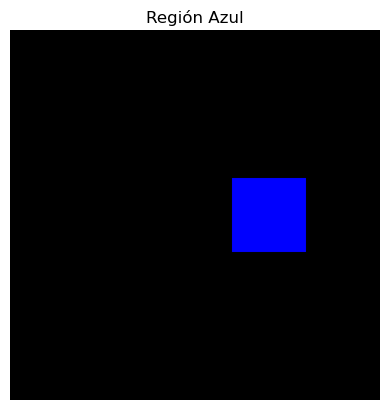

In [27]:
# Pintar una región de la imagen de un color específico (Rojo)
blank[200:300, 300:400] = 0, 0, 255  
# Modificamos un bloque rectangular de la imagen en las filas 200-300 y columnas 300-400,
# cambiando el color de esos píxeles a (0, 0, 255), lo que representa el color rojo en formato BGR.
# Es decir, el bloque rectangular será rojo.

# Mostrar la imagen con la sección pintada de rojo
plt.imshow(blank)  
plt.title("Región Azul")
plt.axis('off')  # Opcional: elimina los ejes
plt.show()

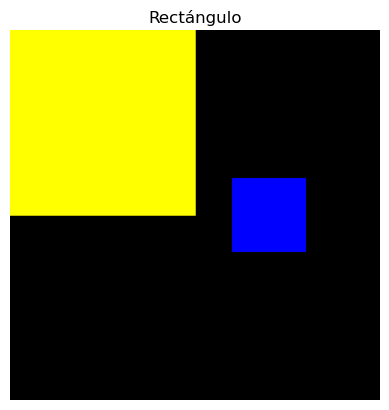

In [28]:
# Dibujar un rectángulo verde (en la mitad superior izquierda)
cv.rectangle(blank, (0, 0), (blank.shape[1]//2, blank.shape[0]//2), (255, 255, 0), thickness=-1)  
# cv.rectangle() dibuja un rectángulo. Los parámetros son:
#  - (0, 0): coordenadas del vértice superior izquierdo.
#  - (blank.shape[1]//2, blank.shape[0]//2): coordenadas del vértice inferior derecho (mitad de la imagen).
#  - (0, 255, 0): color amarillo en formato BGR.
#  - thickness=-1: rellena el rectángulo (si thickness fuera positivo, dibujaría solo el borde).
# El rectángulo verde será dibujado sobre la imagen.

# Mostrar la imagen con el rectángulo amarillo
plt.imshow(blank)  
plt.title("Rectángulo")
plt.axis('off')
plt.show()

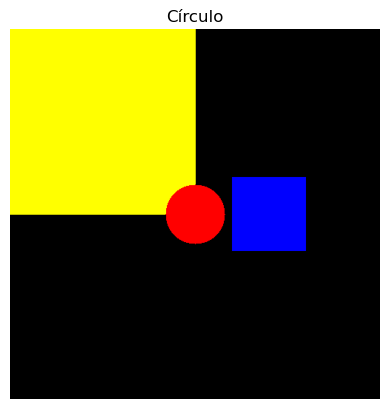

In [29]:
# Dibujar un círculo rojo en el centro de la imagen
cv.circle(blank, (blank.shape[1]//2, blank.shape[0]//2), 40, (255, 0, 0), thickness=-1)  
# cv.circle() dibuja un círculo. Los parámetros son:
#  - (blank.shape[1]//2, blank.shape[0]//2): coordenadas del centro del círculo (en el centro de la imagen).
#  - 40: radio del círculo.
#  - (0, 0, 255): color rojo en formato BGR.
#  - thickness=-1: relleno del círculo (si thickness fuera positivo, solo dibujaría el contorno).
# El círculo será rojo y se dibuja sobre la imagen.

# Mostrar la imagen con el rectángulo amarillo
plt.imshow(blank)  
plt.title("Círculo")
plt.axis('off')
plt.show()

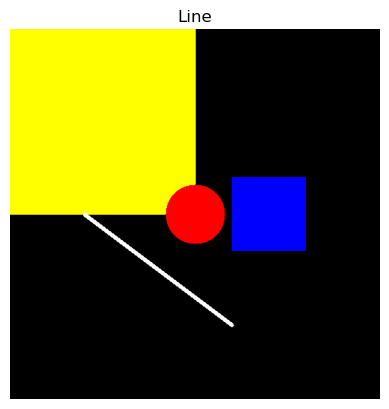

In [30]:
# Dibujar una línea blanca
cv.line(blank, (100, 250), (300, 400), (255, 255, 255), thickness=3)  
# cv.line() dibuja una línea. Los parámetros son:
#  - (100, 250): coordenadas del punto de inicio de la línea.
#  - (300, 400): coordenadas del punto final de la línea.
#  - (255, 255, 255): color blanco en formato BGR.
#  - thickness=3: grosor de la línea (3 píxeles).
# La línea blanca se dibuja sobre la imagen.

# Mostrar la imagen con la línea blanca
plt.imshow(blank)  
plt.title("Line")
plt.axis('off')
plt.show()

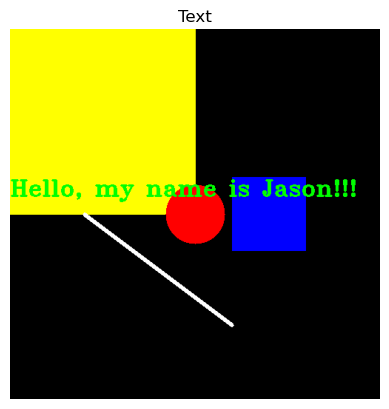

In [31]:
# Escribir texto sobre la imagen
cv.putText(blank, 'Hello, my name is Jason!!!', (0, 225), cv.FONT_HERSHEY_TRIPLEX, 1.0, (0, 255, 0), 2)  
# cv.putText() dibuja texto sobre la imagen. Los parámetros son:
#  - 'Hello, my name is Jason!!!': el texto a mostrar.
#  - (0, 225): las coordenadas donde comenzará el texto (esquina inferior izquierda).
#  - cv.FONT_HERSHEY_TRIPLEX: tipo de fuente (en este caso, Triplex).
#  - 1.0: tamaño del texto (escala).
#  - (0, 255, 0): color verde en formato BGR.
#  - 2: grosor del texto.

# Mostrar la imagen con el texto escrito
plt.imshow(blank)  
plt.title("Text")
plt.axis('off')
plt.show()

3593.5
8
8619.0
4
10398.5
4
10236.0
8
1612.5
3
10402.0
4
6389.0
4
5629.0
3
3475.5
4
2270.5
4
3552.5
8
8674.0
4
2646.0
4
5690.5
3
10234.0
8
5712.0
3


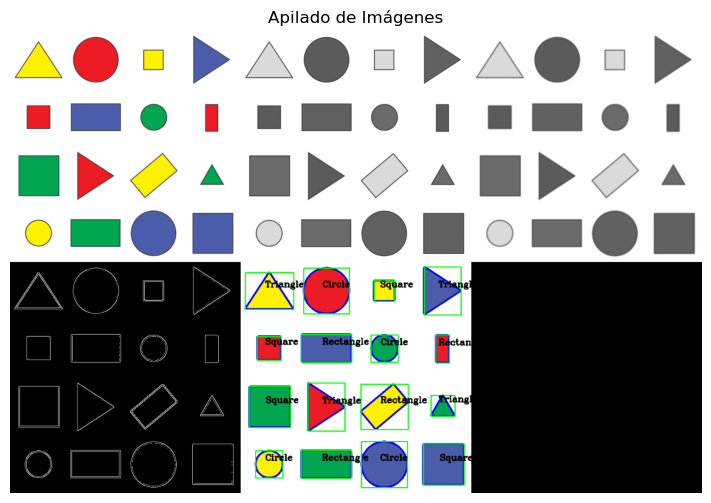

In [32]:
import cv2
import numpy as np

# Función para apilar imágenes en una sola ventana
def stackImages(scale, imgArray):
    rows = len(imgArray)  # Número de filas en la matriz de imágenes
    cols = len(imgArray[0])  # Número de columnas en la matriz de imágenes
    rowsAvailable = isinstance(imgArray[0], list)  # Verifica si las imágenes están en una matriz anidada
    width = imgArray[0][0].shape[1]  # Ancho de la primera imagen
    height = imgArray[0][0].shape[0]  # Altura de la primera imagen
    
    if rowsAvailable:
        for x in range(rows):
            for y in range(cols):
                # Redimensionar imágenes al mismo tamaño si es necesario
                if imgArray[x][y].shape[:2] == imgArray[0][0].shape[:2]:
                    imgArray[x][y] = cv2.resize(imgArray[x][y], (0, 0), None, scale, scale)
                else:
                    imgArray[x][y] = cv2.resize(imgArray[x][y], 
                                                (imgArray[0][0].shape[1], imgArray[0][0].shape[0]), 
                                                None, scale, scale)
                # Convertir imágenes en escala de grises a color BGR
                if len(imgArray[x][y].shape) == 2:
                    imgArray[x][y] = cv2.cvtColor(imgArray[x][y], cv2.COLOR_GRAY2BGR)
        imageBlank = np.zeros((height, width, 3), np.uint8)  # Imagen vacía para relleno
        hor = [imageBlank] * rows  # Inicializar lista de filas
        for x in range(rows):
            hor[x] = np.hstack(imgArray[x])  # Apilar imágenes horizontalmente
        ver = np.vstack(hor)  # Apilar las filas verticalmente
    else:
        for x in range(rows):
            # Procesar una sola fila de imágenes
            if imgArray[x].shape[:2] == imgArray[0].shape[:2]:
                imgArray[x] = cv2.resize(imgArray[x], (0, 0), None, scale, scale)
            else:
                imgArray[x] = cv2.resize(imgArray[x], 
                                         (imgArray[0].shape[1], imgArray[0].shape[0]), 
                                         None, scale, scale)
            if len(imgArray[x].shape) == 2:
                imgArray[x] = cv2.cvtColor(imgArray[x], cv2.COLOR_GRAY2BGR)
        hor = np.hstack(imgArray)  # Apilar horizontalmente
        ver = hor  # Solo hay una fila
    return ver  # Devuelve la imagen apilada

# Función para encontrar contornos y clasificarlos por su forma
def getContours(img):
    # Encontrar contornos en la imagen binaria
    contours, hierarchy = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    for cnt in contours:
        area = cv2.contourArea(cnt)  # Calcular el área del contorno
        print(area)
        if area > 500:  # Filtrar contornos pequeños
            cv2.drawContours(imgContour, cnt, -1, (255, 0, 0), 3)  # Dibujar contorno en la imagen
            peri = cv2.arcLength(cnt, True)  # Calcular el perímetro del contorno
            approx = cv2.approxPolyDP(cnt, 0.02 * peri, True)  # Aproximar la forma del contorno
            print(len(approx))  # Número de vértices del contorno aproximado
            objCor = len(approx)  # Guardar número de vértices
            x, y, w, h = cv2.boundingRect(approx)  # Rectángulo delimitador

            # Clasificar la forma del objeto según el número de vértices
            if objCor == 3:
                objectType = "Triangle"
            elif objCor == 4:
                aspRatio = w / float(h)  # Relación de aspecto
                if 0.98 < aspRatio < 1.03:
                    objectType = "Square"
                else:
                    objectType = "Rectangle"
            elif objCor > 4:
                objectType = "Circle"
            else:
                objectType = "None"

            # Dibujar el rectángulo y el nombre del objeto
            cv2.rectangle(imgContour, (x, y), (x + w, y + h), (0, 255, 0), 2)
            cv2.putText(imgContour, objectType, 
                        (x + (w // 2) - 10, y + (h // 2) - 10), 
                        cv2.FONT_HERSHEY_COMPLEX, 0.7, 
                        (0, 0, 0), 2)

# Cargar la imagen de entrada
path = 'figuras.png'
img = cv2.imread(path)
imgContour = img.copy()  # Crear una copia para dibujar los contornos

# Preprocesamiento: escala de grises, desenfoque y detección de bordes
imgGray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
imgBlur = cv2.GaussianBlur(imgGray, (7, 7), 1)
imgCanny = cv2.Canny(imgBlur, 50, 50)

# Detectar contornos
getContours(imgCanny)

# Crear una imagen vacía
imgBlank = np.zeros_like(img)

# Apilar imágenes en una sola ventana
imgStack = stackImages(0.8, ([img, imgGray, imgBlur],
                             [imgCanny, imgContour, imgBlank]))

# Mostrar usando matplotlib
# Matplotlib usa el formato RGB, por lo que debemos convertir las imágenes
plt.figure(figsize=(10, 6))
plt.imshow(cv2.cvtColor(imgStack, cv2.COLOR_BGR2RGB))
plt.axis('off')  # Ocultar ejes
plt.title("Apilado de Imágenes")
plt.show()

In [ ]:
# Este código es útil para trabajar con imágenes y videos en tiempo real usando OpenCV.

# Cargar una imagen desde la ruta especificada
img = cv.imread('../Resources/Photos/cats.jpg')
# cv.imread() lee la imagen desde el archivo. La imagen se carga en formato BGR (Blue, Green, Red), que es el formato por defecto de OpenCV.

# Mostrar la imagen en una ventana emergente con el nombre 'Cats'
cv.imshow('Cats', img)

# Esperar hasta que el usuario presione una tecla para cerrar la ventana
cv.waitKey(0)
# cv.waitKey(0) espera a que el usuario presione una tecla. El parámetro 0 indica que esperará indefinidamente.

# --------------------
# Leer un video
capture = cv.VideoCapture('../Resources/Videos/dog.mp4')

# Bucle para leer y mostrar los fotogramas del video
while True:
    isTrue, frame = capture.read()
    # capture.read() lee el siguiente fotograma del video. Devuelve dos valores:
    # - isTrue: un valor booleano que indica si la lectura del fotograma fue exitosa.
    # - frame: el fotograma leído, si la lectura fue exitosa, o None si falló.

    # Verificamos si la lectura del fotograma fue exitosa (isTrue es True)
    if isTrue:
        # Mostrar el fotograma actual del video en una ventana llamada 'Video'
        cv.imshow('Video', frame)
        
        # Si el usuario presiona la tecla 'd', salir del bucle y detener el video
        if cv.waitKey(20) & 0xFF == ord('d'):
            break
        # cv.waitKey(20) espera 20 milisegundos antes de procesar el siguiente fotograma. Si la tecla 'd' es presionada, se sale del bucle.
    else:
        # Si no se pudo leer un fotograma (al final del video o error), romper el bucle
        break

# Liberar el objeto de captura de video después de terminar la lectura
capture.release()
# cv.VideoCapture().release() libera el objeto de captura de video y cierra el archivo del video.

# Cerrar todas las ventanas de OpenCV
cv.destroyAllWindows()
# cv.destroyAllWindows() cierra todas las ventanas creadas por OpenCV.

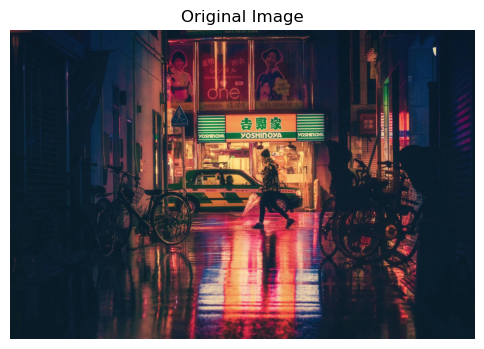

In [33]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Cargar la imagen desde la ruta especificada
img = cv.imread('tokyo3.jpg')
# cv.imread() lee la imagen desde el archivo. La imagen se carga en formato BGR (Blue, Green, Red), que es el formato por defecto de OpenCV.

# Convertir la imagen de BGR a RGB (matplotlib usa RGB por defecto)
imgRGB = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Mostrar la imagen original
plt.figure(figsize=(6,6))  # Ajustamos el tamaño de la figura
plt.imshow(imgRGB)
plt.axis('off')
plt.title('Original Image')
plt.show()

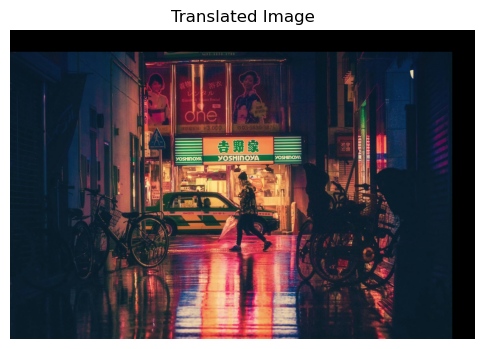

In [34]:
# Función de traslación (Translation)
def translate(img, x, y):
    # np.float32() crea una matriz de tipo flotante de 32 bits para los valores de la transformación.
    transMat = np.float32([[1, 0, x], [0, 1, y]])
    # La matriz de transformación tiene la forma [[1, 0, x], [0, 1, y]], donde:
    # - x y y son las distancias en píxeles que la imagen se moverá en las direcciones horizontal (x) y vertical (y).
    # - Si x es negativo, la imagen se moverá hacia la izquierda, si es positivo, hacia la derecha.
    # - Si y es negativo, la imagen se moverá hacia arriba, si es positivo, hacia abajo.

    dimensions = (img.shape[1], img.shape[0])  # Dimensiones de la imagen (ancho, alto)
    return cv.warpAffine(img, transMat, dimensions)
    # cv.warpAffine() aplica la transformación afín definida por la matriz 'transMat' sobre la imagen 'img'.

# Realizar una traslación: mover la imagen 100 píxeles hacia la derecha (-100) y 100 píxeles hacia abajo (100).
translated = translate(img, -100, 100)
translatedRGB = cv.cvtColor(translated, cv.COLOR_BGR2RGB)  # Convertir a RGB

# Mostrar la imagen trasladada
plt.figure(figsize=(6,6))  # Ajustamos el tamaño
plt.imshow(translatedRGB)
plt.axis('off')
plt.title('Translated Image')
plt.show()

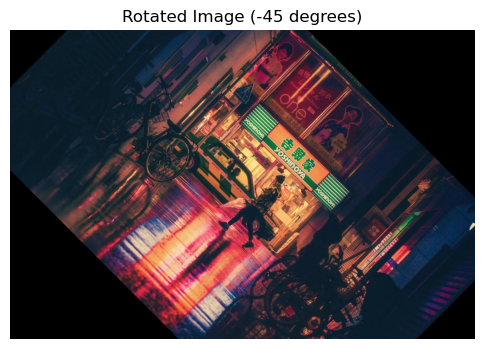

In [35]:
# Función de rotación (Rotation)
def rotate(img, angle, rotPoint=None):
    # Obtener las dimensiones de la imagen (alto, ancho)
    (height, width) = img.shape[:2]

    # Si no se especifica un punto de rotación, se usa el centro de la imagen
    if rotPoint is None:
        rotPoint = (width // 2, height // 2)
    
    # Obtener la matriz de rotación usando el punto de rotación y el ángulo especificado
    rotMat = cv.getRotationMatrix2D(rotPoint, angle, 1.0)
    # cv.getRotationMatrix2D() genera una matriz de rotación. Los parámetros son:
    # - rotPoint: el punto alrededor del cual se rota la imagen.
    # - angle: el ángulo de rotación en grados (positivo para sentido antihorario, negativo para sentido horario).
    # - 1.0: el factor de escala (sin escalado, es 1.0).

    dimensions = (width, height)  # Dimensiones de la imagen (ancho, alto)
    return cv.warpAffine(img, rotMat, dimensions)
    # cv.warpAffine() aplica la transformación afín (en este caso, la rotación) a la imagen.

# Realizar rotación de -45 grados (sentido horario)
rotated = rotate(img, -45)
rotatedRGB = cv.cvtColor(rotated, cv.COLOR_BGR2RGB)  # Convertir a RGB

# Mostrar la imagen rotada
plt.figure(figsize=(6,6))
plt.imshow(rotatedRGB)
plt.axis('off')
plt.title('Rotated Image (-45 degrees)')
plt.show()

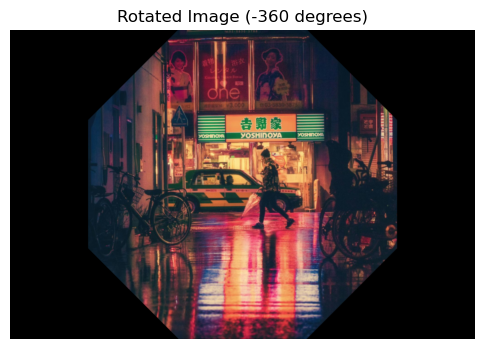

In [36]:
# Realizar rotación de -360 grados (sentido horario)
rotated = rotate(img, -45)
rotated2 = rotate(rotated, -45)
rotated3 = rotate(rotated2, -45)
rotated4 = rotate(rotated3, -45)
rotated5 = rotate(rotated4, -45)
rotated6 = rotate(rotated5, -45)
rotated7 = rotate(rotated6, -45)
rotated8 = rotate(rotated7, -45)
rotatedRGB = cv.cvtColor(rotated8, cv.COLOR_BGR2RGB)  # Convertir a RGB

# Mostrar la imagen rotada
plt.figure(figsize=(6,6))
plt.imshow(rotatedRGB)
plt.axis('off')
plt.title('Rotated Image (-360 degrees)')
plt.show()

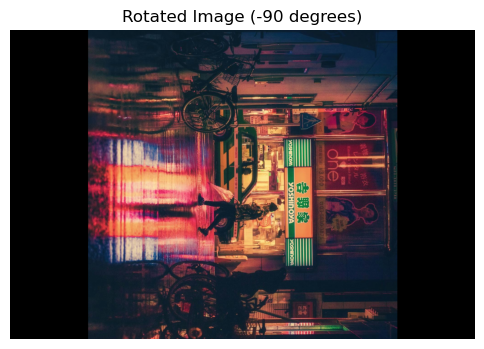

In [37]:
# Realizar rotación de -90 grados (sentido horario)
rotated_rotated = rotate(img, -90)
rotated_rotatedRGB = cv.cvtColor(rotated_rotated, cv.COLOR_BGR2RGB)  # Convertir a RGB

# Mostrar la imagen rotada 90 grados más
plt.figure(figsize=(6,6)) 
plt.imshow(rotated_rotatedRGB)
plt.axis('off')
plt.title('Rotated Image (-90 degrees)')
plt.show()

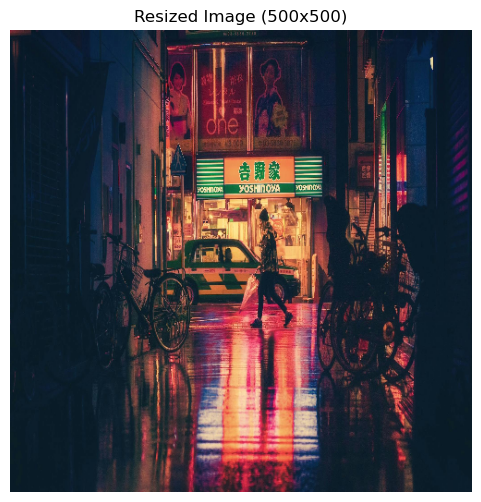

In [38]:
# Redimensionado (Resizing)
resized = cv.resize(img, (500, 500), interpolation=cv.INTER_CUBIC)
resizedRGB = cv.cvtColor(resized, cv.COLOR_BGR2RGB)  # Convertir a RGB

# Mostrar la imagen redimensionada
plt.figure(figsize=(6,6))
plt.imshow(resizedRGB)
plt.axis('off')
plt.title('Resized Image (500x500)')
plt.show()

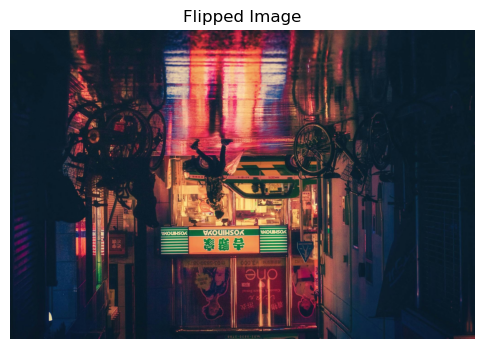

In [39]:
# Volteo (Flipping)
flip = cv.flip(img, -1)  # Volteo en ambos ejes
flipRGB = cv.cvtColor(flip, cv.COLOR_BGR2RGB)  # Convertir a RGB

# Mostrar la imagen volteada
plt.figure(figsize=(6,6))
plt.imshow(flipRGB)
plt.axis('off')
plt.title('Flipped Image')
plt.show()

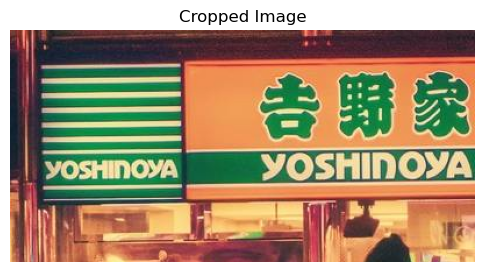

In [40]:
# Recorte (Cropping)
cropped = img[350:550, 800:1200]  # Recortar una región de la imagen
croppedRGB = cv.cvtColor(cropped, cv.COLOR_BGR2RGB)  # Convertir a RGB

# Mostrar la imagen recortada
plt.figure(figsize=(6,6))  # Ajustar el tamaño
plt.imshow(croppedRGB)
plt.axis('off')
plt.title('Cropped Image')
plt.show()

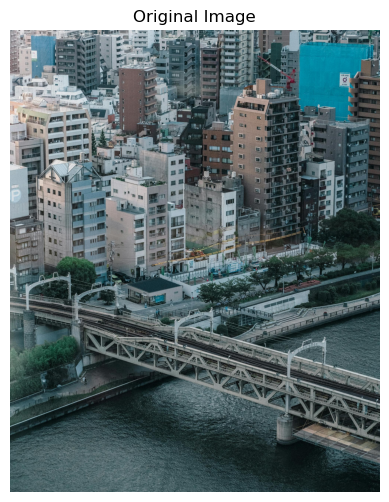

In [41]:
import cv2 as cv
import matplotlib.pyplot as plt

# Cargar la imagen desde la ruta especificada
img = cv.imread('ciudad.jpg')
# cv.imread() lee la imagen desde el archivo. La imagen se carga en formato BGR (Blue, Green, Red), que es el formato por defecto de OpenCV.

# Convertir la imagen de BGR a RGB (matplotlib usa RGB por defecto)
imgRGB = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Mostrar la imagen original
plt.figure(figsize=(6,6))
plt.imshow(imgRGB)
plt.axis('off')
plt.title('Original Image')
plt.show()

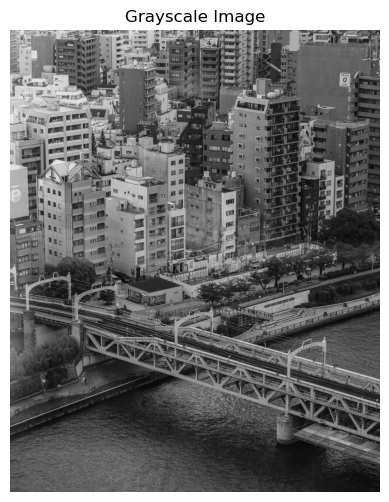

In [42]:
# Convertir la imagen a escala de grises
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
# cv.cvtColor() convierte la imagen de BGR a escala de grises (únicamente valores de intensidad).

# Mostrar la imagen en escala de grises
plt.figure(figsize=(6,6))
plt.imshow(gray, cmap='gray')  # Usamos 'cmap="gray"' para mostrar en escala de grises
plt.axis('off')
plt.title('Grayscale Image')
plt.show()

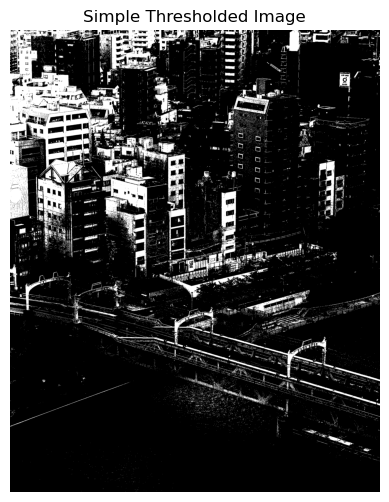

In [43]:
# Thresholding Simple
threshold, thresh = cv.threshold(gray, 150, 255, cv.THRESH_BINARY)
# cv.threshold() aplica un umbral simple sobre la imagen en escala de grises:
# - Si un pixel tiene un valor mayor a 150, se establece en 255 (blanco).
# - Si es menor, se establece en 0 (negro).

# Mostrar la imagen con threshold simple
plt.figure(figsize=(6,6))
plt.imshow(thresh, cmap='gray')  # Mostrar con cmap='gray' para que se vea como una imagen en escala de grises
plt.axis('off')
plt.title('Simple Thresholded Image')
plt.show()

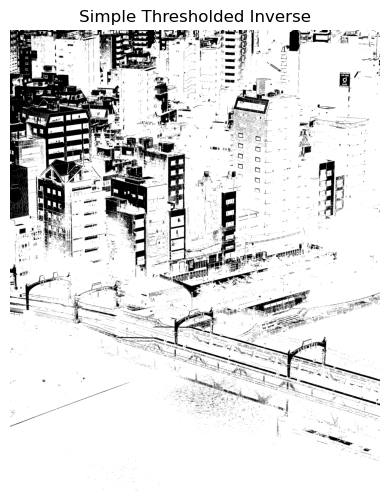

In [44]:
# Thresholding Inverso
threshold, thresh_inv = cv.threshold(gray, 150, 255, cv.THRESH_BINARY_INV)
# THRESH_BINARY_INV invierte los valores del umbral.
# Los píxeles que antes eran 0 ahora serán 255 y viceversa.

# Mostrar la imagen con threshold inverso
plt.figure(figsize=(6,6))
plt.imshow(thresh_inv, cmap='gray')  # Usamos 'cmap="gray"' para mostrar la imagen en escala de grises
plt.axis('off')
plt.title('Simple Thresholded Inverse')
plt.show()

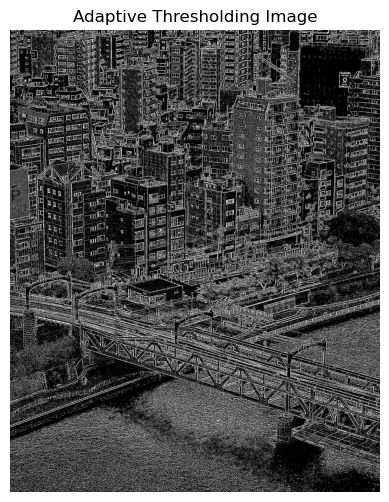

In [45]:
# Thresholding Adaptativo
adaptive_thresh = cv.adaptiveThreshold(gray, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY_INV, 11, 9)
# cv.adaptiveThreshold() aplica un umbral adaptativo, lo que significa que el umbral cambia en cada pixel según el vecindario.
# - El método ADAPTIVE_THRESH_GAUSSIAN_C calcula el umbral usando una vecindad de pixels.
# - THRESH_BINARY_INV invierte los colores (negro y blanco).

# Mostrar la imagen con threshold adaptativo
plt.figure(figsize=(6,6))
plt.imshow(adaptive_thresh, cmap='gray')  # Usamos 'cmap="gray"' para mostrar la imagen en escala de grises
plt.axis('off')
plt.title('Adaptive Thresholding Image')
plt.show()

In [ ]:
import cv2
import numpy as np

# Función para actualizar el color según los valores de los trackbars
def empty(a):
    pass

# Crear una ventana para los trackbars
cv2.namedWindow("TrackBars")
cv2.resizeWindow("TrackBars", 640, 240)

# Crear trackbars para ajustar los valores del rango de colores HSV
cv2.createTrackbar("Hue Min", "TrackBars", 0, 179, empty)  # Matiz mínimo
cv2.createTrackbar("Hue Max", "TrackBars", 179, 179, empty)  # Matiz máximo
cv2.createTrackbar("Sat Min", "TrackBars", 0, 255, empty)  # Saturación mínima
cv2.createTrackbar("Sat Max", "TrackBars", 255, 255, empty)  # Saturación máxima
cv2.createTrackbar("Val Min", "TrackBars", 0, 255, empty)  # Valor mínimo
cv2.createTrackbar("Val Max", "TrackBars", 255, 255, empty)  # Valor máximo

# Leer la imagen desde el archivo
img = cv2.imread("Resources/lena.png")

# Convertir la imagen al espacio de color HSV
imgHSV = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

while True:
    # Leer los valores actuales de los trackbars
    h_min = cv2.getTrackbarPos("Hue Min", "TrackBars")
    h_max = cv2.getTrackbarPos("Hue Max", "TrackBars")
    s_min = cv2.getTrackbarPos("Sat Min", "TrackBars")
    s_max = cv2.getTrackbarPos("Sat Max", "TrackBars")
    v_min = cv2.getTrackbarPos("Val Min", "TrackBars")
    v_max = cv2.getTrackbarPos("Val Max", "TrackBars")

    # Definir los límites de color para la máscara
    lower = np.array([h_min, s_min, v_min])
    upper = np.array([h_max, s_max, v_max])

    # Crear una máscara basada en los valores de los trackbars
    mask = cv2.inRange(imgHSV, lower, upper)

    # Aplicar la máscara sobre la imagen original
    imgResult = cv2.bitwise_and(img, img, mask=mask)

    # Mostrar las imágenes originales, máscara y resultado
    cv2.imshow("Original", img)
    cv2.imshow("HSV", imgHSV)
    cv2.imshow("Mask", mask)
    cv2.imshow("Result", imgResult)

    # Salir del bucle si se presiona la tecla 'q'
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Cerrar todas las ventanas
cv2.destroyAllWindows()


Text(0.5, 1.0, 'Imagen Original')

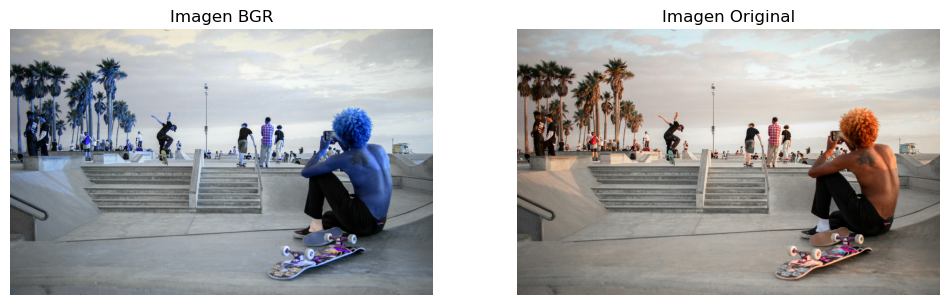

In [46]:
# Cargar la imagen desde la ruta especificada
img = cv.imread('skate.jpg')
# cv.imread() lee la imagen desde el archivo. La imagen se carga en formato BGR (Blue, Green, Red), que es el formato por defecto de OpenCV.

# Convertir la imagen de BGR a RGB para mostrarla correctamente con matplotlib (ya que OpenCV usa BGR por defecto)
imgRGB = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Convertir la imagen de BGR a Escala de Grises (Grayscale)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
# cv.cvtColor() convierte la imagen de BGR a Escala de Grises (intensidad de luz, sin color).

# Ajustar el tamaño de la figura para que las imágenes se vean más grandes
plt.figure(figsize=(12, 6))  # (ancho, alto) en pulgadas

# Mostrar la primera imagen (original)
plt.subplot(1, 2, 1)  # (filas, columnas, índice de la imagen)
plt.imshow(img)
plt.axis('off')
plt.title('Imagen BGR')

# Mostrar la primera imagen (original)
plt.subplot(1, 2, 2)  # (filas, columnas, índice de la imagen)
plt.imshow(imgRGB)
plt.axis('off')  # Opcional: quitar los ejes
plt.title('Imagen Original')

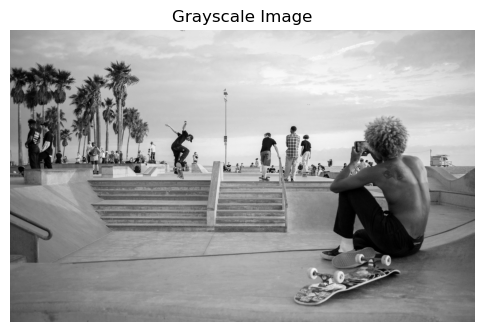

In [47]:
# Mostrar la imagen en escala de grises
plt.figure(figsize=(6,6))
plt.imshow(gray, cmap='gray')  # Usamos 'cmap="gray"' para mostrar la imagen en escala de grises
plt.axis('off')
plt.title('Grayscale Image')
plt.show()

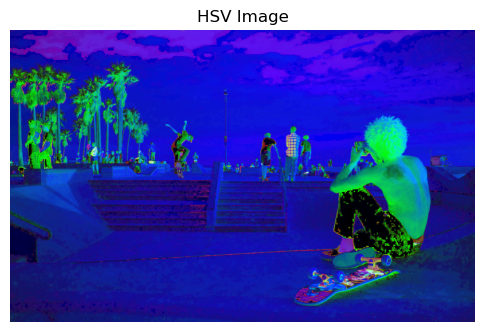

In [48]:
# Convertir la imagen de BGR a HSV (Hue, Saturation, Value)
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
# cv.cvtColor() convierte la imagen de BGR a HSV (tono, saturación y valor), un modelo de color comúnmente usado para el procesamiento de imágenes.

# Mostrar la imagen en formato HSV
plt.figure(figsize=(6,6))
plt.imshow(hsv)
plt.axis('off')
plt.title('HSV Image')
plt.show()

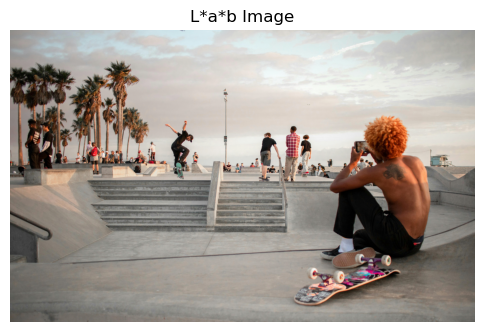

In [49]:
# Convertir la imagen de BGR a L*a*b (modelo de color perceptual)
lab = cv.cvtColor(img, cv.COLOR_BGR2LAB)
# El modelo de color L*a*b es un modelo perceptual basado en la forma en que los humanos ven el color.
# L es la luminosidad, a y b son los componentes cromáticos.

# Mostrar la imagen en formato L*a*b
plt.figure(figsize=(6,6))
plt.imshow(cv.cvtColor(lab, cv.COLOR_LAB2RGB))  # Convertimos LAB a RGB para visualizarla correctamente
plt.axis('off')
plt.title('L*a*b Image')
plt.show()

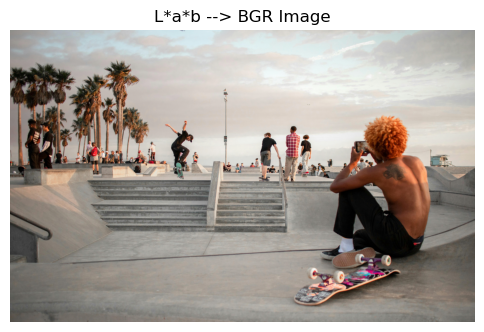

In [50]:
# Convertir la imagen de L*a*b a BGR
lab_bgr = cv.cvtColor(lab, cv.COLOR_LAB2BGR)
# Convertimos la imagen de L*a*b de nuevo a BGR.

# Mostrar la imagen convertida de L*a*b a BGR
plt.figure(figsize=(6,6))
plt.imshow(cv.cvtColor(lab_bgr, cv.COLOR_BGR2RGB))  # Convertimos de BGR a RGB para mostrar correctamente
plt.axis('off')
plt.title('L*a*b --> BGR Image')
plt.show()


Text(0.5, 1.0, 'Imagen Laplaciana')

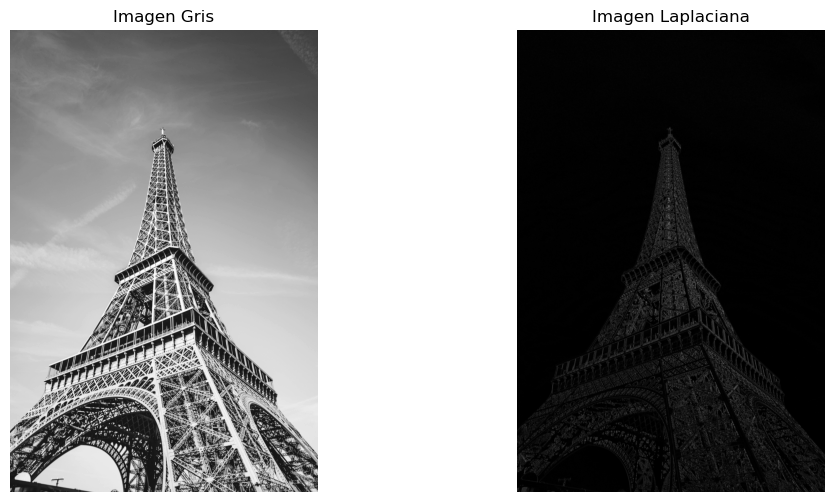

In [51]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Cargar la imagen y convertir a escala de grises
img = cv.imread('torre.jpg')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# **Laplaciano** - Detecta bordes a partir de la segunda derivada de la imagen.
lap = cv.Laplacian(gray, cv.CV_64F)
lap = np.uint8(np.absolute(lap))
# El Laplaciano es una técnica que utiliza la segunda derivada para resaltar los bordes de la imagen.

# Ajustar el tamaño de la figura para que las imágenes se vean más grandes
plt.figure(figsize=(12, 6))  # (ancho, alto) en pulgadas

# Mostrar la primera imagen (original)
plt.subplot(1, 2, 1)  # (filas, columnas, índice de la imagen)
plt.imshow(gray, cmap='gray')
plt.axis('off')
plt.title('Imagen Gris')

# Mostrar la primera imagen (original)
plt.subplot(1, 2, 2)  # (filas, columnas, índice de la imagen)
plt.imshow(lap, cmap='gray')
plt.axis('off')  # Opcional: quitar los ejes
plt.title('Imagen Laplaciana')

Text(0.5, 1.0, 'Sobel Y')

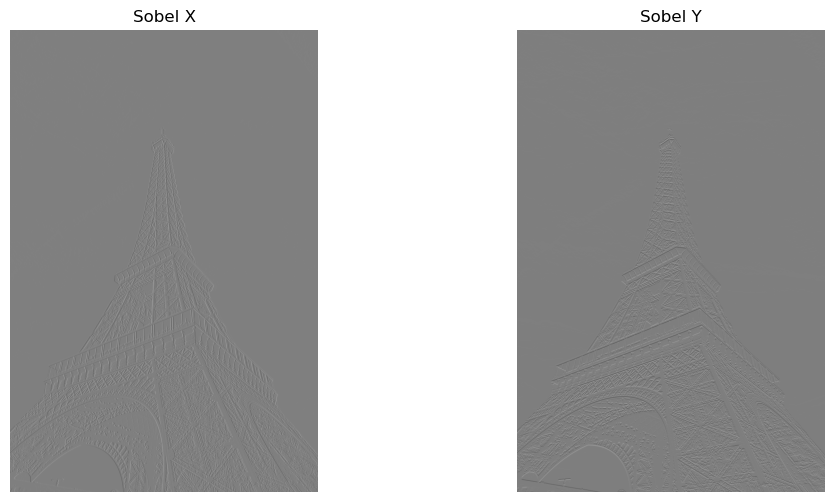

In [52]:
# **Sobel** - Detecta bordes utilizando las derivadas de la imagen.
sobelx = cv.Sobel(gray, cv.CV_64F, 1, 0, ksize=3)  # Derivada en la dirección X (horizontal)
sobely = cv.Sobel(gray, cv.CV_64F, 0, 1, ksize=3)  # Derivada en la dirección Y (vertical)

# Ajustar el tamaño de la figura para que las imágenes se vean más grandes
plt.figure(figsize=(12, 6))  # (ancho, alto) en pulgadas

# Mostrar Sobel X
plt.subplot(1, 2, 1)
plt.imshow(sobelx, cmap='gray')
plt.axis('off')
plt.title('Sobel X')
# Mostrar Sobel Y
plt.subplot(1, 2, 2)
plt.imshow(sobely, cmap='gray')
plt.axis('off')
plt.title('Sobel Y')

Text(0.5, 1.0, 'Sobel Combinada')

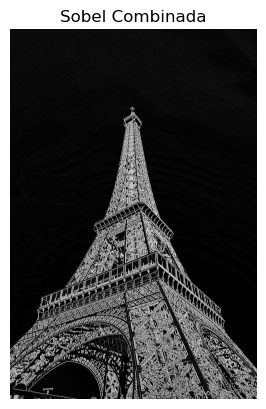

In [53]:
# Convertir los resultados de Sobel a un formato apropiado (uint8)
sobelx = cv.convertScaleAbs(sobelx)
sobely = cv.convertScaleAbs(sobely)

# Combinar los bordes detectados en X e Y
combined_sobel = cv.bitwise_or(sobelx, sobely)
# El `bitwise_or` combina ambos bordes (X y Y) para obtener una representación más completa de los bordes.

# Mostrar Sobel combinado (X + Y)
plt.imshow(combined_sobel, cmap='gray')
plt.axis('off')
plt.title('Sobel Combinada')

Text(0.5, 1.0, 'Bordes Con Canny')

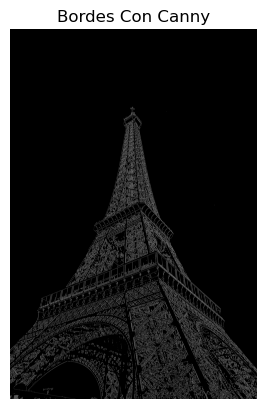

In [54]:
# **Canny** - Detector de bordes basado en gradientes, más avanzado y sensible.
canny = cv.Canny(gray, 150, 175)
# El detector Canny usa un enfoque basado en dos umbrales para determinar si un píxel es parte de un borde.

# Mostrar la imagen con Canny
plt.imshow(canny, cmap='gray')
plt.axis('off')
plt.title('Bordes Con Canny')

Tamaño de la imagen original: (8192, 5461, 3)
Tamaño del canal azul: (8192, 5461)
Tamaño del canal verde: (8192, 5461)
Tamaño del canal rojo: (8192, 5461)


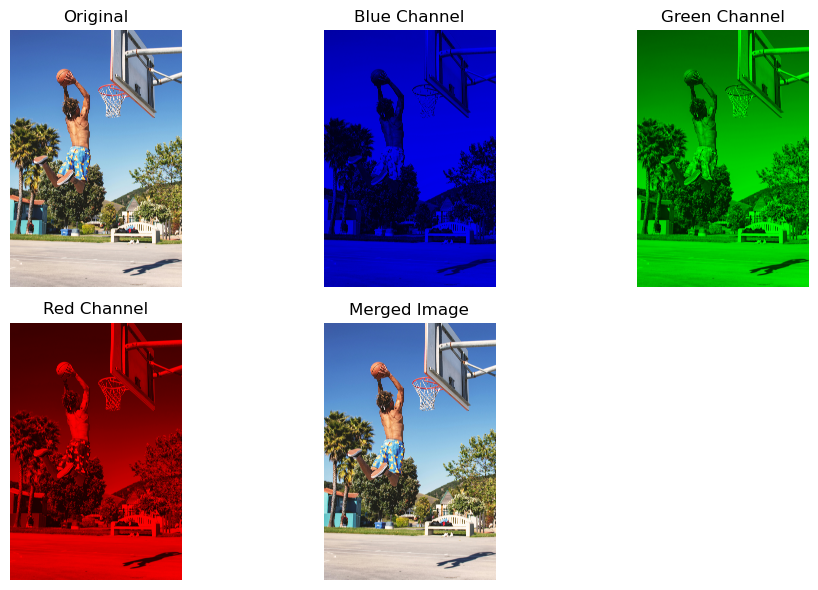

In [55]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Cargar la imagen desde el archivo
img = cv.imread('basketball.jpg')

# Crear una imagen en blanco con las mismas dimensiones que la imagen original
blank = np.zeros(img.shape[:2], dtype='uint8')

# Separar los canales de color: azul, verde y rojo
b, g, r = cv.split(img)

# Crear imágenes con un solo canal de color (rojo, verde o azul) y los otros canales en negro
blue = cv.merge([b, blank, blank])   # Solo canal azul
green = cv.merge([blank, g, blank])  # Solo canal verde
red = cv.merge([blank, blank, r])    # Solo canal rojo

# Usar Matplotlib para mostrar las imágenes (en vez de cv.imshow)
# Convertir de BGR (formato de OpenCV) a RGB para que Matplotlib las muestre correctamente
plt.figure(figsize=(10, 6))

# Mostrar la imagen original
plt.subplot(2, 3, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))  # Convertir a RGB para visualización correcta
plt.title('Original')
plt.axis('off')  # Desactivar los ejes

# Mostrar las imágenes de los canales de color
plt.subplot(2, 3, 2)
plt.imshow(cv.cvtColor(blue, cv.COLOR_BGR2RGB))
plt.title('Blue Channel')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv.cvtColor(green, cv.COLOR_BGR2RGB))
plt.title('Green Channel')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv.cvtColor(red, cv.COLOR_BGR2RGB))
plt.title('Red Channel')
plt.axis('off')

# Imprimir las formas de las imágenes
print(f"Tamaño de la imagen original: {img.shape}")
print(f"Tamaño del canal azul: {b.shape}")
print(f"Tamaño del canal verde: {g.shape}")
print(f"Tamaño del canal rojo: {r.shape}")

# Combinar nuevamente los canales en una imagen
merged = cv.merge([b, g, r])

# Mostrar la imagen combinada
plt.subplot(2, 3, 5)
plt.imshow(cv.cvtColor(merged, cv.COLOR_BGR2RGB))
plt.title('Merged Image')
plt.axis('off')

# Mostrar la ventana con las imágenes
plt.tight_layout()
plt.show()


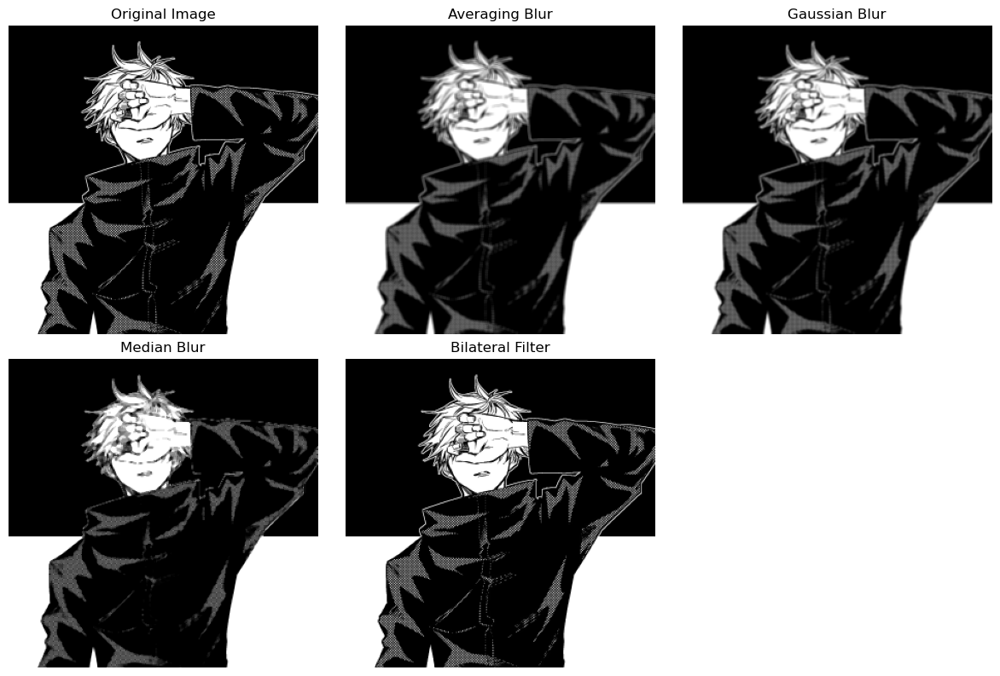

In [56]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Cargar la imagen desde el archivo
img = cv.imread('anime.png')

# Mostrar la imagen original usando OpenCV (se cambiará por Matplotlib más abajo)
# cv.imshow('Cats', img)

# Filtro de Promediado (Averaging Blur)
# El parámetro (3, 3) es el tamaño del *kernel*. En este caso, el kernel es de 3x3,
# lo que significa que cada píxel será reemplazado por el promedio de los píxeles vecinos
# El filtro suaviza la imagen y reduce el ruido, pero también puede difuminar los bordes y detalles.
average = cv.blur(img, (3, 3))

# Filtro Gaussiano (Gaussian Blur)
# El parámetro (3, 3) es el tamaño del kernel (3x3).
# El parámetro 0 es sigma, que controla la cantidad de desenfoque. En este caso, sigma se ajusta automáticamente.
# El filtro suaviza la imagen de manera más controlada, preservando mejor los bordes y detalles que el filtro de promediado.
gauss = cv.GaussianBlur(img, (3, 3), 0)

# Filtro de Mediana (Median Blur)
# El parámetro 3 indica que se usará un *kernel* de 3x3.
# Este filtro reemplaza cada píxel por la mediana de los píxeles en su vecindad.
# Este filtro es muy efectivo para eliminar el ruido tipo "sal y pimienta", preservando los bordes y detalles de la imagen.
median = cv.medianBlur(img, 3)

# Filtro Bilateral (Bilateral Filter)
# El parámetro 10 es el tamaño del kernel, que determina el radio de la vecindad a considerar.
# El parámetro 35 es sigma en el espacio de color, controlando la sensibilidad a las diferencias de color.
# El parámetro 25 es sigma en el espacio de las coordenadas espaciales, controlando la sensibilidad a las distancias entre píxeles.
# El filtro bilateral suaviza la imagen y reduce el ruido, pero preserva los bordes, lo que es útil en aplicaciones donde los contornos de los objetos deben mantenerse nítidos, como en segmentación y mejora de imágenes.
bilateral = cv.bilateralFilter(img, 10, 35, 25)

# Usar Matplotlib para mostrar las imágenes (en vez de cv.imshow)
# Convertir de BGR a RGB para que Matplotlib las muestre correctamente

plt.figure(figsize=(12, 8))

# Mostrar la imagen original
plt.subplot(2, 3, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))  # Convertir a RGB para visualización
plt.title('Original Image')
plt.axis('off')  # Desactivar los ejes

# Mostrar el filtro de promediado (blur)
plt.subplot(2, 3, 2)
plt.imshow(cv.cvtColor(average, cv.COLOR_BGR2RGB))
plt.title('Averaging Blur')
plt.axis('off')

# Mostrar el filtro Gaussiano (Gaussian Blur)
plt.subplot(2, 3, 3)
plt.imshow(cv.cvtColor(gauss, cv.COLOR_BGR2RGB))
plt.title('Gaussian Blur')
plt.axis('off')

# Mostrar el filtro de mediana (Median Blur)
plt.subplot(2, 3, 4)
plt.imshow(cv.cvtColor(median, cv.COLOR_BGR2RGB))
plt.title('Median Blur')
plt.axis('off')

# Mostrar el filtro bilateral (Bilateral Filter)
plt.subplot(2, 3, 5)
plt.imshow(cv.cvtColor(bilateral, cv.COLOR_BGR2RGB))
plt.title('Bilateral Filter')
plt.axis('off')

# Mostrar todas las imágenes con Matplotlib
plt.tight_layout()
plt.show()

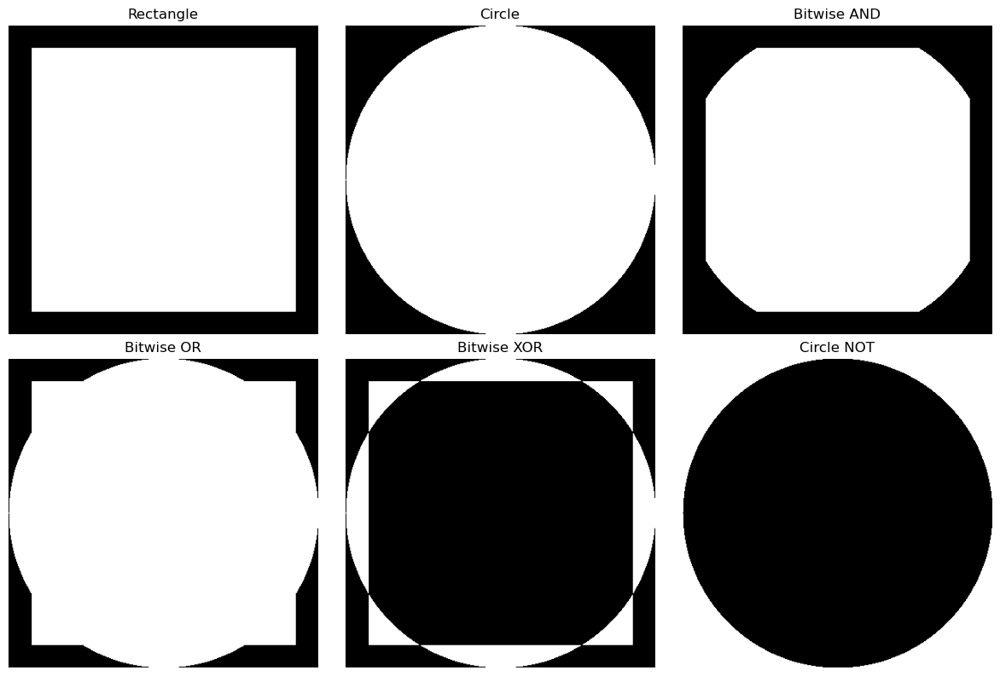

In [59]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Crear una imagen en blanco de 400x400 píxeles (en escala de grises, valores entre 0 y 255)
blank = np.zeros((400, 400), dtype='uint8')

# Crear un rectángulo blanco de 340x340 píxeles, con el punto superior izquierdo en (30, 30) y el inferior derecho en (370, 370)
# El valor 255 indica color blanco, y el parámetro -1 llena el rectángulo
rectangle = cv.rectangle(blank.copy(), (30, 30), (370, 370), 255, -1)

# Crear un círculo blanco con centro en (200, 200) y radio 200 píxeles
circle = cv.circle(blank.copy(), (200, 200), 200, 255, -1)

plt.figure(figsize=(12, 8))

# Mostrar el rectángulo
plt.subplot(2, 3, 1)
plt.imshow(rectangle, cmap='gray')  # Mostrar en escala de grises
plt.title('Rectangle')
plt.axis('off')

# Mostrar el círculo
plt.subplot(2, 3, 2)
plt.imshow(circle, cmap='gray')  # Mostrar en escala de grises
plt.title('Circle')
plt.axis('off')

# Operación bitwise AND: muestra solo las regiones de la intersección de ambos (donde ambos son blancos)
bitwise_and = cv.bitwise_and(rectangle, circle)

# Mostrar la operación AND
plt.subplot(2, 3, 3)
plt.imshow(bitwise_and, cmap='gray')
plt.title('Bitwise AND')
plt.axis('off')

# Operación bitwise OR: muestra todas las regiones donde al menos uno de los dos es blanco
bitwise_or = cv.bitwise_or(rectangle, circle)

# Mostrar la operación OR
plt.subplot(2, 3, 4)
plt.imshow(bitwise_or, cmap='gray')
plt.title('Bitwise OR')
plt.axis('off')

# Operación bitwise XOR: muestra las regiones donde solo uno de los dos es blanco (excluye la intersección)
bitwise_xor = cv.bitwise_xor(rectangle, circle)

# Mostrar la operación XOR
plt.subplot(2, 3, 5)
plt.imshow(bitwise_xor, cmap='gray')
plt.title('Bitwise XOR')
plt.axis('off')

# Operación bitwise NOT: invierte los valores de los píxeles del círculo (lo convierte en negro donde estaba blanco y viceversa)
bitwise_not = cv.bitwise_not(circle)

# Mostrar la operación NOT sobre el círculo
plt.subplot(2, 3, 6)
plt.imshow(bitwise_not, cmap='gray')
plt.title('Circle NOT')
plt.axis('off')

# Mostrar todas las imágenes procesadas
plt.tight_layout()
plt.show()


Dimensiones de la imagen: (251, 508, 3)


(-0.5, 507.5, 250.5, -0.5)

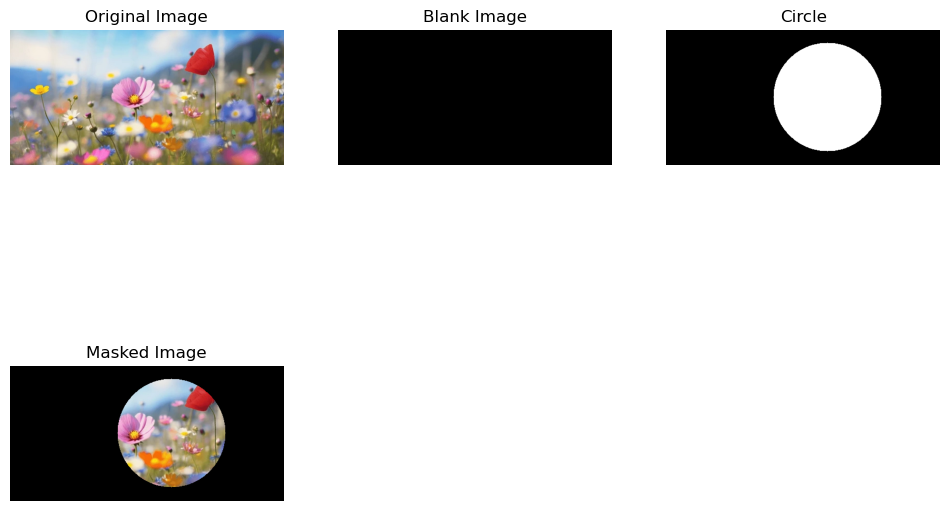

In [60]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Cargar la imagen
img = cv.imread('flores.png')
print(f'Dimensiones de la imagen: {img.shape}')

# Crear una imagen en blanco del mismo tamaño que la imagen original
blank = np.zeros(img.shape[:2], dtype='uint8')

# Crear un círculo blanco en el centro de la imagen en blanco
# (img.shape[1]//2 + 45, img.shape[0]//2) es el centro del círculo en el punto (x, y)
# 100 es el radio del círculo, y 255 es el valor de color (blanco) en una imagen en escala de grises
circle = cv.circle(blank.copy(), (img.shape[1]//2 + 45, img.shape[0]//2), 100, 255, -1)

# Aplicar la máscara 'weird_shape' a la imagen original usando la operación bitwise AND
# Esto mantiene solo las áreas de la imagen original que corresponden a las regiones blancas en 'weird_shape'
masked = cv.bitwise_and(img, img, mask=circle)

# Visualización con Matplotlib
plt.figure(figsize=(12, 8))

# Mostrar la imagen original
plt.subplot(2, 3, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))  # Convertir a RGB para visualización
plt.title('Original Image')
plt.axis('off')

# Mostrar la imagen en blanco
plt.subplot(2, 3, 2)
plt.imshow(blank, cmap='gray')
plt.title('Blank Image')
plt.axis('off')

# Mostrar el círculo
plt.subplot(2, 3, 3)
plt.imshow(circle, cmap='gray')
plt.title('Circle')
plt.axis('off')

# Mostrar la imagen enmascarada (solo donde la figura extraña se superpone con la imagen)
plt.subplot(2, 3, 4)
plt.imshow(cv.cvtColor(masked, cv.COLOR_BGR2RGB))  # Convertir a RGB para visualización
plt.title('Masked Image')
plt.axis('off')

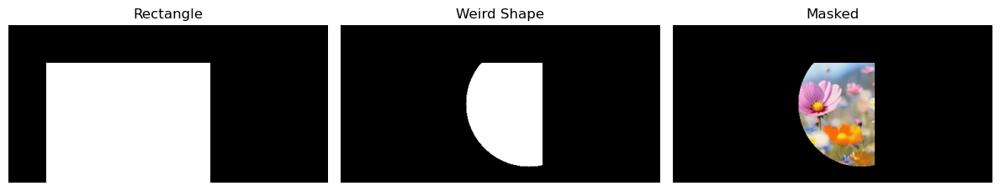

In [61]:
# Cargar la imagen
img = cv.imread('flores.png')

# Crear un rectángulo blanco en la imagen en blanco
# El rectángulo va de (30, 30) a (370, 370) y tiene color blanco (255)
rectangle = cv.rectangle(blank.copy(), (60, 60), (320, 370), 255, -1)

# Crear una figura extraña usando la operación bitwise AND entre el círculo y el rectángulo
# Solo se mantienen las regiones donde tanto el círculo como el rectángulo tienen valor 255 (blanco)
weird_shape = cv.bitwise_and(circle, rectangle)

# Mostrar la figura extraña resultante
# cv.imshow('Weird Shape', weird_shape)

# Aplicar la máscara 'weird_shape' a la imagen original usando la operación bitwise AND
# Esto mantiene solo las áreas de la imagen original que corresponden a las regiones blancas en 'weird_shape'
masked = cv.bitwise_and(img, img, mask=weird_shape)

# Visualización con Matplotlib
plt.figure(figsize=(12, 8))

# Mostrar el rectángulo
plt.subplot(1, 3, 1)
plt.imshow(rectangle, cmap='gray')
plt.title('Rectangle')
plt.axis('off')

# Mostrar la figura extraña (intersección del círculo y el rectángulo)
plt.subplot(1, 3, 2)
plt.imshow(weird_shape, cmap='gray')
plt.title('Weird Shape')
plt.axis('off')

# Mostrar la figura extraña (intersección del círculo y el rectángulo)
plt.subplot(1, 3, 3)
plt.imshow(cv.cvtColor(masked, cv.COLOR_BGR2RGB))
plt.title('Masked')
plt.axis('off')

# Mostrar todas las imágenes procesadas
plt.tight_layout()
plt.show()


In [ ]:
import cv2 as cv

# Función para redimensionar un frame (imagen o video) con un factor de escala
def rescaleFrame(frame, scale=0.75):
    """
    Redimensiona un frame (ya sea una imagen, un video o un video en vivo) según el factor de escala dado.
    - frame: Imagen o frame de video que queremos redimensionar.
    - scale: Factor de escala que determina el porcentaje de la nueva dimensión en relación con la original. Por defecto es 0.75 (75% del tamaño original).
    
    Retorna el frame redimensionado.
    """
    # Cálculo de las nuevas dimensiones (ancho y alto) basado en el factor de escala
    width = int(frame.shape[1] * scale)  # frame.shape[1] es el ancho de la imagen (frame)
    height = int(frame.shape[0] * scale)  # frame.shape[0] es la altura de la imagen (frame)

    # Nuevas dimensiones como una tupla (ancho, alto)
    dimensions = (width, height)

    # Usamos cv.resize para redimensionar la imagen o video con la interpolación de área
    return cv.resize(frame, dimensions, interpolation=cv.INTER_AREA)

# Función para cambiar la resolución en tiempo real del video
def changeRes(width, height):
    """
    Cambia la resolución de la captura de video en tiempo real.
    - width: Ancho deseado en píxeles.
    - height: Alto deseado en píxeles.
    """
    capture.set(3, width)  # Establece el ancho del video (índice 3 es para ancho)
    capture.set(4, height)  # Establece el alto del video (índice 4 es para altura)

# Abrir el archivo de video
capture = cv.VideoCapture('../Resources/Videos/dog.mp4')  # Se abre el video ubicado en la ruta indicada

# Verifica si el video fue cargado correctamente
if not capture.isOpened():
    print("Error al abrir el video")
    exit()

while True:
    # Leer un frame del video
    isTrue, frame = capture.read()

    # Si no se pudo leer el frame (fin del video)
    if not isTrue:
        print("No se pudo leer el frame")
        break

    # Redimensionar el frame con la función rescaleFrame, usando un 20% del tamaño original
    frame_resized = rescaleFrame(frame, scale=0.2)

    # Mostrar el video original
    cv.imshow('Video', frame)

    # Mostrar el video redimensionado
    cv.imshow('Video Resized', frame_resized)

    # Si se presiona la tecla 'd', el ciclo se detiene
    if cv.waitKey(20) & 0xFF == ord('d'):
        break

# Liberar el recurso del video y cerrar las ventanas
capture.release()
cv.destroyAllWindows()

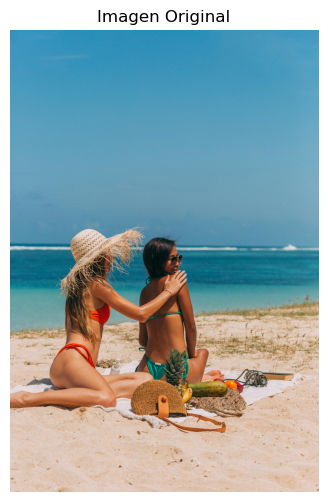

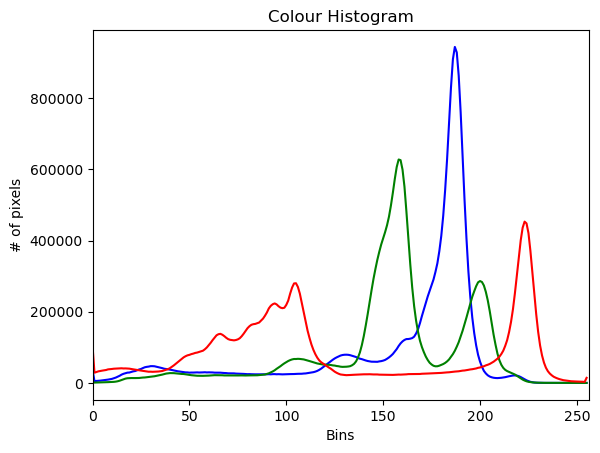

In [62]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

# Leer la imagen desde la ruta especificada
img = cv.imread('playa.jpg')

# Mostrar la imagen usando Matplotlib
plt.figure(figsize=(6,6))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))  # Convertir de BGR a RGB para Matplotlib
plt.title('Imagen Original')
plt.axis('off')  # Desactivar los ejes
plt.show()

# HISTOGRAMA EN COLOR
# Mostrar el histograma para cada canal de color (azul, verde, rojo)
plt.figure()
plt.title('Colour Histogram')
plt.xlabel('Bins')
plt.ylabel('# of pixels')

# Definir los colores para cada canal
colors = ('b', 'g', 'r')

# Calcula y muestra el histograma de los canales de color (azul, verde y rojo) de la imagen, 
# mostrando cómo se distribuyen los niveles de intensidad de cada color.
for i, col in enumerate(colors):
    # Calcular el histograma para cada canal, usando la máscara
    hist = cv.calcHist([img], [i], None, [256], [0, 256])
    # [img]: La imagen de entrada.
    # [i]: El canal de color a analizar (0 = azul, 1 = verde, 2 = rojo).
    # mask: Una máscara que limita el cálculo del histograma solo a la región de interés.
    # [256]: El número de "bins" (intervalos) del histograma. En este caso, 256 para representar los niveles de intensidad de 0 a 255.
    # [0, 256]: El rango de valores de intensidad que se analizarán (de 0 a 255).
    
    # Graficar el histograma del canal
    plt.plot(hist, color=col)
    plt.xlim([0, 256])  # Limitar el eje X entre 0 y 256 (niveles de intensidad)

# Mostrar el histograma de los tres canales de color
plt.show()


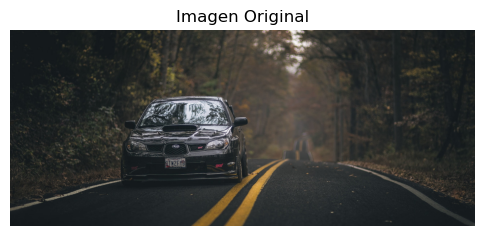

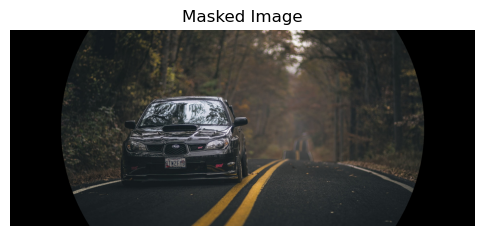

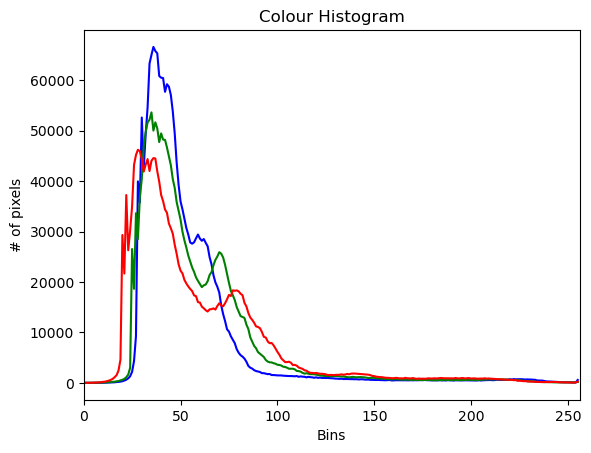

In [63]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

# Leer la imagen desde la ruta especificada
img = cv.imread('subaru2.jpg')

# Mostrar la imagen usando Matplotlib
plt.figure(figsize=(6,6))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))  # Convertir de BGR a RGB para Matplotlib
plt.title('Imagen Original')
plt.axis('off')  # Desactivar los ejes
plt.show()

# Crear una imagen en blanco con el mismo tamaño que la imagen original
blank = np.zeros(img.shape[:2], dtype='uint8')

# Crear una máscara circular centrada en la imagen, con radio 100
# El color 255 es blanco (completamente visible), y -1 rellena el círculo
mask = cv.circle(blank, (img.shape[1]//2, img.shape[0]//2), 1000, 255, -1)

# Aplicar la máscara a la imagen usando la operación bitwise AND
# Esto mantiene solo las regiones de la imagen que están dentro del círculo
masked = cv.bitwise_and(img, img, mask=mask)

# Mostrar la imagen enmascarada usando Matplotlib
plt.figure(figsize=(6,6))
plt.imshow(cv.cvtColor(masked, cv.COLOR_BGR2RGB))  # Convertir de BGR a RGB
plt.title('Masked Image')
plt.axis('off')
plt.show()

# HISTOGRAMA EN COLOR
# Mostrar el histograma para cada canal de color (azul, verde, rojo)
plt.figure()
plt.title('Colour Histogram')
plt.xlabel('Bins')
plt.ylabel('# of pixels')

# Definir los colores para cada canal
colors = ('b', 'g', 'r')

# Para cada canal de color (b = azul, g = verde, r = rojo)
for i, col in enumerate(colors):
    # Calcular el histograma para cada canal, usando la máscara
    hist = cv.calcHist([img], [i], mask, [256], [0, 256])
    
    # Graficar el histograma del canal
    plt.plot(hist, color=col)
    plt.xlim([0, 256])  # Limitar el eje X entre 0 y 256 (niveles de intensidad)

# Mostrar el histograma de los tres canales de color
plt.show()


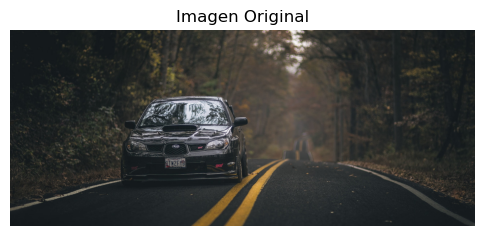

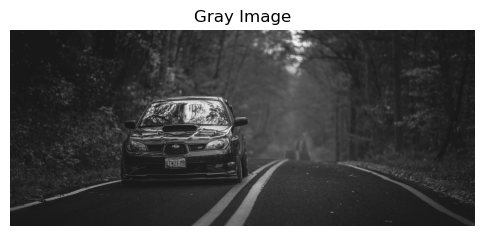

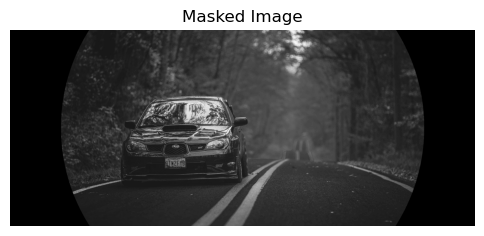

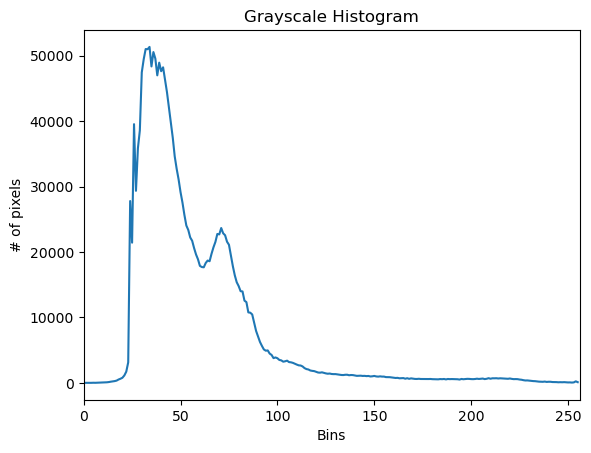

In [64]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

# Leer la imagen desde la ruta especificada
img = cv.imread('subaru2.jpg')

# Mostrar la imagen usando Matplotlib
plt.figure(figsize=(6,6))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))  # Convertir de BGR a RGB para Matplotlib
plt.title('Imagen Original')
plt.axis('off')  # Desactivar los ejes
plt.show()

# Crear una imagen en blanco con el mismo tamaño que la imagen original
blank = np.zeros(img.shape[:2], dtype='uint8')

# Crear una máscara circular centrada en la imagen, con radio 100
# El color 255 es blanco (completamente visible), y -1 rellena el círculo
mask = cv.circle(blank, (img.shape[1]//2, img.shape[0]//2), 1000, 255, -1)

# Convertir la imagen original a escala de grises
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Aplicar la máscara a la imagen usando la operación bitwise AND
# Esto mantiene solo las regiones de la imagen que están dentro del círculo
masked = cv.bitwise_and(gray, gray, mask=mask)

# # Mostrar la imagen en escala de grises usando Matplotlib
plt.figure(figsize=(6,6))
plt.imshow(gray, cmap='gray')  # Mostrar la imagen en escala de grises
plt.title('Gray Image')
plt.axis('off')
plt.show()

# Mostrar la imagen enmascarada usando Matplotlib
plt.figure(figsize=(6,6))
plt.imshow(masked, cmap='gray')
plt.title('Masked Image')
plt.axis('off')
plt.show()

# Calcular el histograma de la imagen en escala de grises (comentado)
gray_hist = cv.calcHist([gray], [0], mask, [256], [0,256])

# # Mostrar el histograma de la imagen en escala de grises
plt.figure()
plt.title('Grayscale Histogram')
plt.xlabel('Bins')
plt.ylabel('# of pixels')
plt.plot(gray_hist)
plt.xlim([0,256])
plt.show()

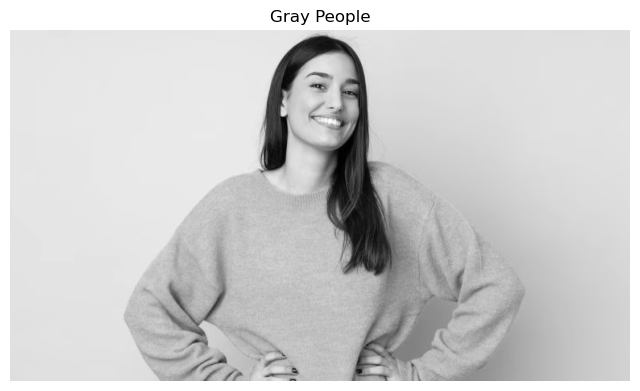

Number of faces found = 1


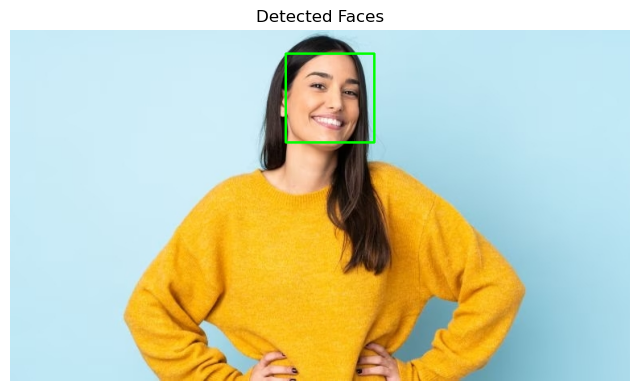

In [1]:
import cv2 as cv
import matplotlib.pyplot as plt

# Cargar la imagen desde la ruta especificada
img = cv.imread('person.jpg')

# Convertir la imagen original a escala de grises (en blanco y negro)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Mostrar la imagen en escala de grises usando Matplotlib
plt.figure(figsize=(8, 8))
plt.imshow(gray, cmap='gray')  # Mostrar la imagen en escala de grises
plt.title('Gray People')
plt.axis('off')  # Desactivar los ejes
plt.show()

# Cargar el clasificador Haar para detección de rostros
# `haar_face.xml` es un archivo XML preentrenado para detectar rostros en imágenes
haar_cascade = cv.CascadeClassifier('haar_face.xml')

# Detectar los rostros en la imagen en escala de grises
# `detectMultiScale` detecta objetos (rostros) de diferentes tamaños
faces_rect = haar_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=1)
# El parámetro scaleFactor ajusta la imagen durante la detección, y minNeighbors controla la sensibilidad de la detección.

# Imprimir el número de rostros encontrados
print(f'Number of faces found = {len(faces_rect)}')

# Dibujar un rectángulo alrededor de cada rostro detectado
# `faces_rect` contiene las coordenadas de los rostros detectados
# Cada rostro es representado por una tupla (x, y, w, h), donde:
# x, y: coordenadas del vértice superior izquierdo del rectángulo
# w, h: ancho y alto del rectángulo
for (x, y, w, h) in faces_rect:
    # Dibujar un rectángulo verde alrededor de cada rostro detectado
    cv.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), thickness=2)

# Mostrar la imagen con los rostros detectados usando Matplotlib
plt.figure(figsize=(8, 8))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))  # Convertir de BGR a RGB para Matplotlib
plt.title('Detected Faces')
plt.axis('off')  # Desactivar los ejes
plt.show()

In [ ]:
import os
import cv2 as cv
import numpy as np

# Lista de personas que queremos reconocer, cada índice corresponde a una persona
people = ['Ben Afflek', 'Elton John', 'Jerry Seinfield', 'Madonna', 'Mindy Kaling']

# Directorio donde se encuentran las imágenes de entrenamiento
# Cada subdirectorio dentro de este directorio corresponde a una persona
DIR = r'..Media Files\Faces\train'  # Asegúrate de tener imágenes organizadas en carpetas por persona

# Cargar el clasificador Haar preentrenado para detectar rostros
haar_cascade = cv.CascadeClassifier('haar_face.xml')  # Este archivo XML es el clasificador Haar preentrenado

# Listas donde se almacenarán las características y las etiquetas de cada rostro detectado
features = []
labels = []

# Función para crear el conjunto de entrenamiento
def create_train():
    # Recorrer todas las personas en la lista `people`
    for person in people:
        # Crear la ruta completa hacia el directorio de la persona
        path = os.path.join(DIR, person)
        # La etiqueta será el índice de la persona en la lista `people`
        label = people.index(person)

        # Recorrer todas las imágenes en el directorio de la persona
        for img in os.listdir(path):
            # Crear la ruta completa de la imagen
            img_path = os.path.join(path, img)

            # Leer la imagen
            img_array = cv.imread(img_path)
            if img_array is None:
                continue  # Si la imagen no se puede leer, continuar con la siguiente

            # Convertir la imagen a escala de grises
            gray = cv.cvtColor(img_array, cv.COLOR_BGR2GRAY)

            # Detectar rostros en la imagen en escala de grises
            faces_rect = haar_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=4)
            # El parámetro scaleFactor ajusta la imagen durante la detección, y minNeighbors controla la sensibilidad de la detección.

            # Para cada rostro detectado, extraer la región de interés (ROI) del rostro
            for (x, y, w, h) in faces_rect:
                faces_roi = gray[y:y + h, x:x + w]  # Extraer el rostro

                # Añadir el rostro y su etiqueta correspondiente a las listas
                features.append(faces_roi)  # Características del rostro (en escala de grises)
                labels.append(label)  # Etiqueta correspondiente (índice de la persona)

# Llamar a la función para crear el conjunto de entrenamiento
create_train()
print('Training done ---------------')

# Convertir las listas `features` y `labels` a arreglos numpy para ser utilizadas en el entrenamiento
features = np.array(features, dtype='object')
labels = np.array(labels)

# Crear un objeto LBPH Face Recognizer (Local Binary Patterns Histograms)
face_recognizer = cv.face.LBPHFaceRecognizer_create()

# Entrenar el modelo de reconocimiento facial con las características y las etiquetas
face_recognizer.train(features, labels)

# Guardar el modelo entrenado en un archivo para usarlo posteriormente
face_recognizer.save('face_trained.yml')

# Guardar las características y etiquetas en archivos numpy para su reutilización
np.save('features.npy', features)
np.save('labels.npy', labels)

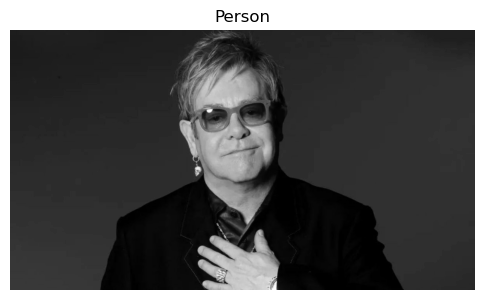

Label = Elton John with a confidence of 76.86899881073747


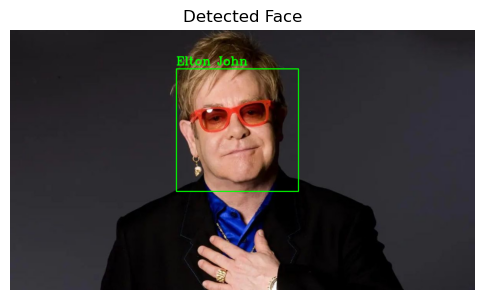

In [2]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

# Cargar el clasificador Haar preentrenado para la detección de rostros
haar_cascade = cv.CascadeClassifier('haar_face.xml')

# Lista de nombres correspondientes a las personas entrenadas en el modelo
people = ['Ben Afflek', 'Elton John', 'Jerry Seinfield', 'Madonna', 'Mindy Kaling']

# Cargar el modelo de reconocimiento facial entrenado usando LBPH (Local Binary Patterns Histograms)
face_recognizer = cv.face.LBPHFaceRecognizer_create()  # Crear el objeto de reconocimiento facial LBPH
face_recognizer.read('face_trained.yml')  # Leer el modelo entrenado desde el archivo .yml

# Cargar una imagen para la predicción (aquí se usa una imagen de "Elton John")
img = cv.imread(r'elton.jpg')

# Convertir la imagen a escala de grises, ya que la detección y reconocimiento facial se realiza en escala de grises
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Mostrar la imagen en escala de grises usando Matplotlib
plt.figure(figsize=(6,6))
plt.imshow(gray, cmap='gray')
plt.title('Person')
plt.axis('off')  # Desactivar los ejes
plt.show()

# Detectar los rostros en la imagen usando el clasificador Haar
faces_rect = haar_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=4)

# Para cada rostro detectado, se realiza la predicción con el modelo de reconocimiento facial
for (x, y, w, h) in faces_rect:
    # Extraer la región de interés (ROI) del rostro detectado
    faces_roi = gray[y:y+h, x:x+w]

    # Usar el modelo entrenado para predecir el label y la confianza del rostro detectado
    label, confidence = face_recognizer.predict(faces_roi)
    print(f'Label = {people[label]} with a confidence of {confidence}')

    # Colocar el nombre de la persona detectada en la imagen
    cv.putText(img, str(people[label]), (x, y-10), cv.FONT_HERSHEY_COMPLEX, 1.0, (0, 255, 0), thickness=2)

    # Dibujar un rectángulo verde alrededor del rostro detectado
    cv.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), thickness=2)

# Mostrar la imagen final con el rostro detectado y el nombre de la persona usando Matplotlib
plt.figure(figsize=(6, 6))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))  # Convertir de BGR a RGB para Matplotlib
plt.title('Detected Face')
plt.axis('off')  # Desactivar los ejes
plt.show()


In [3]:
!pip install --upgrade caer canaro kagglehub --break-system-packages

Defaulting to user installation because normal site-packages is not writeable


In [ ]:
import kagglehub

# Descarga el dataset 'https://www.kaggle.com/datasets/alexattia/the-simpsons-characters-dataset'
path = kagglehub.dataset_download("alexattia/the-simpsons-characters-dataset")

print("Path to dataset files:", path)

In [2]:
import os
import caer
import canaro
import numpy as np
import cv2 as cv
import gc

# Definición de parámetros clave
IMG_SIZE = (80, 80)  # Tamaño de las imágenes de entrada (80x80 píxeles)
channels = 1  # Número de canales en las imágenes (1 para escala de grises)
char_path = r'archive/simpsons_dataset'  # Ruta al conjunto de datos

# Crear un diccionario con la cantidad de imágenes por personaje
char_dict = {}
for char in os.listdir(char_path):
    # Para cada subdirectorio (personaje), contamos las imágenes
    char_dict[char] = len(os.listdir(os.path.join(char_path, char)))

# Ordenar el diccionario por número de imágenes en orden descendente
char_dict = caer.sort_dict(char_dict, descending=True)  # Función de caer para ordenar el diccionario
char_dict  # Mostrar el diccionario ordenado

2024-11-18 01:32:19.376970: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1731915139.402572    5798 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1731915139.410084    5798 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


[('homer_simpson', 2246),
 ('ned_flanders', 1454),
 ('moe_szyslak', 1452),
 ('lisa_simpson', 1354),
 ('bart_simpson', 1342),
 ('marge_simpson', 1291),
 ('krusty_the_clown', 1206),
 ('principal_skinner', 1194),
 ('charles_montgomery_burns', 1193),
 ('milhouse_van_houten', 1079),
 ('chief_wiggum', 986),
 ('abraham_grampa_simpson', 913),
 ('sideshow_bob', 877),
 ('apu_nahasapeemapetilon', 623),
 ('kent_brockman', 498),
 ('comic_book_guy', 469),
 ('edna_krabappel', 457),
 ('nelson_muntz', 358),
 ('lenny_leonard', 310),
 ('mayor_quimby', 246),
 ('waylon_smithers', 181),
 ('maggie_simpson', 128),
 ('groundskeeper_willie', 121),
 ('barney_gumble', 106),
 ('selma_bouvier', 103),
 ('carl_carlson', 98),
 ('ralph_wiggum', 89),
 ('patty_bouvier', 72),
 ('martin_prince', 71),
 ('professor_john_frink', 65),
 ('snake_jailbird', 55),
 ('cletus_spuckler', 47),
 ('rainier_wolfcastle', 45),
 ('simpsons_dataset', 42),
 ('agnes_skinner', 42),
 ('sideshow_mel', 40),
 ('otto_mann', 32),
 ('gil', 27),
 ('fat_

In [3]:
# Selección de los primeros 10 personajes con más imágenes
characters = []  # Lista que almacenará los nombres de los personajes
count = 0
for i in char_dict:
    characters.append(i[0])  # Añadimos el nombre del personaje
    count += 1
    if count >= 10:  # Limitar a los primeros 10 personajes
        break
characters  # Mostrar los primeros 10 personajes seleccionados

['homer_simpson',
 'ned_flanders',
 'moe_szyslak',
 'lisa_simpson',
 'bart_simpson',
 'marge_simpson',
 'krusty_the_clown',
 'principal_skinner',
 'charles_montgomery_burns',
 'milhouse_van_houten']

In [4]:
# Preprocesamiento de imágenes para crear el conjunto de entrenamiento
train = caer.preprocess_from_dir(char_path, characters, channels=channels, IMG_SIZE=IMG_SIZE, isShuffle=True)
# `train` es un conjunto de datos procesados, con imágenes redimensionadas y en escala de grises (según `channels`)

[INFO] Could not find a file to load from. Generating the training data
----------------------------------------------
[INFO] At 1000 files
[INFO] At 2000 files
[INFO] 2246 files found in 0.009614706039428711s
[INFO] At 1000 files
[INFO] 1454 files found in 0.0032961368560791016s
[INFO] At 1000 files
[INFO] 1452 files found in 0.0027375221252441406s
[INFO] At 1000 files
[INFO] 1354 files found in 0.0030717849731445312s
[INFO] At 1000 files
[INFO] 1342 files found in 0.0026216506958007812s
[INFO] At 1000 files
[INFO] 1291 files found in 0.002319812774658203s
[INFO] At 1000 files
[INFO] 1206 files found in 0.0021991729736328125s
[INFO] At 1000 files
[INFO] 1194 files found in 0.002810955047607422s
[INFO] At 1000 files
[INFO] 1193 files found in 0.002184629440307617s
[INFO] At 1000 files
[INFO] 1079 files found in 0.002543926239013672s
----------------------------------------------
[INFO] 13811 files preprocessed! Took 0m 32s


In [5]:
# Ver la cantidad de muestras de entrenamiento
len(train)  # Número total de imágenes de entrenamiento

13811

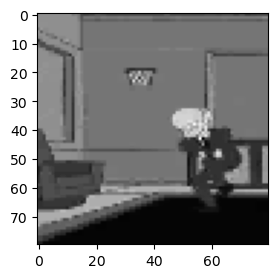

In [6]:
# Visualización de la primera imagen del conjunto de entrenamiento
import matplotlib.pyplot as plt
plt.figure(figsize=(3,3))  # Tamaño de la figura de la imagen
plt.imshow(train[0][0], cmap='gray')  # Muestra la primera imagen (en escala de grises)
plt.show()  # Visualiza la imagen

In [7]:
# Separar las características (imágenes) y las etiquetas (nombres de los personajes)
featureSet, labels = caer.sep_train(train, IMG_SIZE=IMG_SIZE)
# `featureSet` son las imágenes y `labels` son las etiquetas asociadas (personajes)

# Normalizar las características (escala de 0 a 1)
featureSet = caer.normalize(featureSet)  # Normaliza los valores de los píxeles de 0-255 a 0-1

In [8]:
# Convertir las etiquetas de números a vectores binarios (one-hot encoding)
from tensorflow.keras.utils import to_categorical
labels = to_categorical(labels, len(characters))  # Convierte las etiquetas a formato one-hot

In [9]:
# Separar el conjunto de datos en entrenamiento y validación
x_train, x_val, y_train, y_val = caer.train_val_split(featureSet, labels, val_ratio=.2)
# `val_ratio=0.2` indica que el 20% de los datos se usarán para validación

In [10]:
# Liberar memoria
del train  # Eliminar los datos del conjunto de entrenamiento
del featureSet  # Eliminar las características
del labels  # Eliminar las etiquetas
gc.collect()  # Llamar al recolector de basura para liberar memoria no utilizada

0

In [11]:
# Parámetros de entrenamiento
BATCH_SIZE = 32  # Tamaño del lote de datos que se procesarán por cada paso
EPOCHS = 10  # Número de épocas para entrenar el modelo

# Generador de imágenes para aumento de datos (data augmentation)
datagen = canaro.generators.imageDataGenerator()  # Generador que introduce variabilidad aleatoria en las imágenes
train_gen = datagen.flow(x_train, y_train, batch_size=BATCH_SIZE)  # Crea el generador para el entrenamiento


In [14]:
# Creación del modelo de red neuronal
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D

output_dim = 10  # Número de clases (personajes), ya que estamos usando los 10 personajes más comunes

w, h = IMG_SIZE[:2]  # Asignamos el ancho y alto de la imagen a las variables `w` y `h`

model = Sequential()  # Modelo secuencial de Keras
# Capa de convolución con 32 filtros, tamaño 3x3, activación ReLU y padding 'same'
model.add(Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(w, h, channels)))
# Capa adicional de convolución con 32 filtros
model.add(Conv2D(32, (3, 3), activation='relu'))
# Capa de agrupamiento máximo (max pooling) para reducir dimensiones
model.add(MaxPooling2D(pool_size=(2, 2)))
# Capa de dropout para evitar sobreajuste
model.add(Dropout(0.2))

# Segundo bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu')) 
model.add(Conv2D(256, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2))

# Aplanar las salidas para pasarlas a una capa densa
model.add(Flatten())  # Aplana las salidas 2D a 1D
model.add(Dropout(0.35))  # Capa de dropout adicional
model.add(Dense(1024, activation='relu'))  # Capa densa con 1024 neuronas

# Capa de salida, con tantas neuronas como clases (personajes)
model.add(Dense(output_dim, activation='softmax'))  # softmax para clasificación multiclase

# Resumen del modelo
model.summary()  # Imprime un resumen de la arquitectura del modelo

/home/orfeo/.local/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2024-11-18 00:03:37.008696: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 80, 80, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 78, 78, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 39, 39, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 39, 39, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 39, 39, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 37, 37, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 18, 18, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 18, 18, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 18, 18, 256)    │       147,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 16, 16, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │    16,778,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │        10,250 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,591,274 (67.11 MB)

 Trainable params: 17,591,274 (67.11 MB)

 Non-trainable params: 0 (0.00 B)

In [16]:
# Definir el optimizador (SGD) y compilar el modelo
from tensorflow.keras.optimizers import SGD
optimizer = SGD(learning_rate=0.001, decay=1e-7, momentum=0.9, nesterov=True)
# `learning_rate` define la velocidad de aprendizaje, `decay` regula la tasa de aprendizaje durante el entrenamiento
model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])  # Compilación del modelo

/home/orfeo/.local/lib/python3.12/site-packages/keras/src/optimizers/base_optimizer.py:86: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


In [13]:
# Entrenamiento del modelo con un plan de aprendizaje
from tensorflow.keras.callbacks import LearningRateScheduler
callbacks_list = [LearningRateScheduler(canaro.lr_schedule)]  # Plan de aprendizaje (schedule)
training = model.fit(train_gen,  # Generador de datos para entrenamiento
                     steps_per_epoch=len(x_train)//BATCH_SIZE,  # Número de pasos por época
                     epochs=EPOCHS,  # Número de épocas
                     validation_data=(x_val, y_val),  # Datos de validación
                     validation_steps=len(y_val)//BATCH_SIZE,  # Número de pasos de validación
                     callbacks=callbacks_list)  # Usar callbacks definidos
characters

/home/orfeo/.local/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
345/345 ━━━━━━━━━━━━━━━━━━━━ 1227s 4s/step - accuracy: 0.1502 - loss: 26.6706 - val_accuracy: 0.1639 - val_loss: 2.2798 - learning_rate: 0.0100
Epoch 2/10


/usr/lib/python3.12/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(value)


345/345 ━━━━━━━━━━━━━━━━━━━━ 71s 195ms/step - accuracy: 0.2188 - loss: 2.2224 - val_accuracy: 0.1643 - val_loss: 2.2803 - learning_rate: 0.0100
Epoch 3/10
345/345 ━━━━━━━━━━━━━━━━━━━━ 1157s 3s/step - accuracy: 0.1604 - loss: 2.2890 - val_accuracy: 0.1639 - val_loss: 2.3287 - learning_rate: 0.0100
Epoch 4/10
345/345 ━━━━━━━━━━━━━━━━━━━━ 68s 190ms/step - accuracy: 0.0625 - loss: 2.3264 - val_accuracy: 0.1639 - val_loss: 2.3245 - learning_rate: 0.0100
Epoch 5/10
345/345 ━━━━━━━━━━━━━━━━━━━━ 1113s 3s/step - accuracy: 0.1638 - loss: 2.2853 - val_accuracy: 0.1643 - val_loss: 2.2775 - learning_rate: 0.0100
Epoch 6/10
345/345 ━━━━━━━━━━━━━━━━━━━━ 68s 188ms/step - accuracy: 0.1562 - loss: 2.2835 - val_accuracy: 0.1643 - val_loss: 2.2775 - learning_rate: 0.0100
Epoch 7/10
345/345 ━━━━━━━━━━━━━━━━━━━━ 1135s 3s/step - accuracy: 0.1664 - loss: 2.2820 - val_accuracy: 0.1643 - val_loss: 2.2779 - learning_rate: 0.0100
Epoch 8/10
345/345 ━━━━━━━━━━━━━━━━━━━━ 100s 283ms/step - accuracy: 0.1250 - loss: 2

['homer_simpson',
 'ned_flanders',
 'moe_szyslak',
 'lisa_simpson',
 'bart_simpson',
 'marge_simpson',
 'krusty_the_clown',
 'principal_skinner',
 'charles_montgomery_burns',
 'milhouse_van_houten']

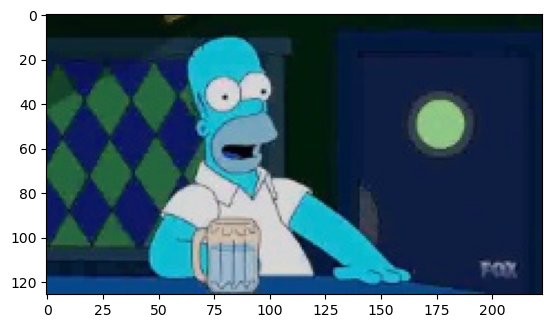

In [14]:
# Ruta de una imagen de prueba
test_path = r'archive/kaggle_simpson_testset/kaggle_simpson_testset/homer_simpson_2.jpg'
img = cv.imread(test_path)  # Leer la imagen de prueba usando OpenCV

# Mostrar la imagen de prueba con matplotlib
plt.imshow(img)
plt.show()

In [15]:
# Función para preparar la imagen para la predicción
def prepare(image):
    image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)  # Convertir la imagen a escala de grises
    image = cv.resize(image, IMG_SIZE)  # Redimensionar la imagen al tamaño adecuado
    image = caer.reshape(image, IMG_SIZE, 1)  # Remodelar la imagen para que tenga 1 canal (escala de grises)
    return image

# Preparar la imagen y hacer la predicción
predictions = model.predict(prepare(img))  # Predicción del modelo

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


In [16]:
# Obtener la clase con mayor probabilidad
print(characters[np.argmax(predictions[0])])  # Mostrar el nombre del personaje con mayor probabilidad

ned_flanders



image 1/1 /home/orfeo/Documents/ArtifitialIntelligence/Proyectos/OpenCV/recamara.jpg: 384x640 1 potted plant, 111.4ms
Speed: 2.5ms preprocess, 111.4ms inference, 2.9ms postprocess per image at shape (1, 3, 384, 640)


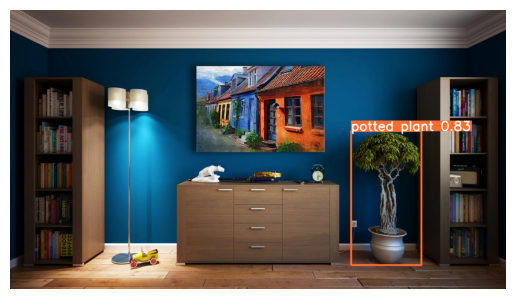

In [32]:
# Importamos la librería necesaria si estás trabajando con YOLO de ultralytics.
from ultralytics import YOLO  # Asegúrate de que la librería esté instalada.

# Configuración y predicción utilizando un modelo YOLO
# Carga el modelo YOLO preentrenado que deseas utilizar. 
model = YOLO('yolo11n.pt')  # Asegúrate de que el archivo del modelo está en la ruta adecuada.

# Especifica la fuente de la imagen que deseas analizar.
source = 'recamara.jpg'

# Realiza la predicción sobre la imagen.
results = model.predict(source=source)

# Visualización de los resultados utilizando matplotlib
# La función 'results[0].plot()' devuelve una imagen con las anotaciones.
annotated_image = results[0].plot()

# Mostramos la imagen anotada en Jupyter Notebook
plt.imshow(cv.cvtColor(annotated_image, cv.COLOR_BGR2RGB))
plt.axis('off')  # Quitamos los ejes para una mejor visualización.
plt.show()



image 1/1 /home/orfeo/Documents/ArtifitialIntelligence/Proyectos/OpenCV/personas3.jpg: 384x640 12 persons, 116.8ms
Speed: 5.7ms preprocess, 116.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


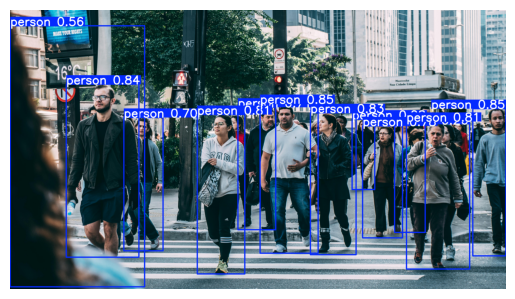

In [30]:
# Especifica la fuente de la imagen que deseas analizar.
source = 'personas3.jpg'

# Realiza la predicción sobre la imagen.
results = model.predict(source=source)

# Visualización de los resultados utilizando matplotlib
# La función 'results[0].plot()' devuelve una imagen con las anotaciones.
annotated_image = results[0].plot()

# Mostramos la imagen anotada en Jupyter Notebook
plt.imshow(cv.cvtColor(annotated_image, cv.COLOR_BGR2RGB))
plt.axis('off')  # Quitamos los ejes para una mejor visualización.
plt.show()


image 1/1 /home/orfeo/Documents/ArtifitialIntelligence/Proyectos/OpenCV/moto.jpg: 448x640 1 person, 1 motorcycle, 174.5ms
Speed: 3.1ms preprocess, 174.5ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)


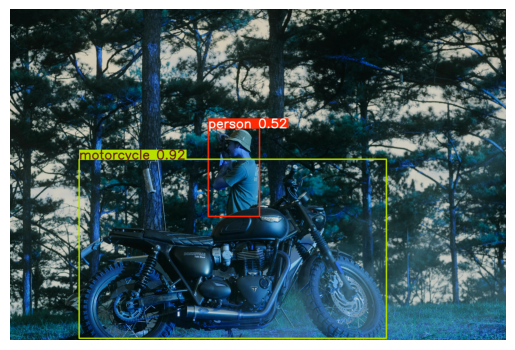

In [18]:
# Especifica la fuente de la imagen que deseas analizar.
source = 'moto.jpg'

# Realiza la predicción sobre la imagen.
results = model.predict(source=source)

# Visualización de los resultados utilizando matplotlib
# La función 'results[0].plot()' devuelve una imagen con las anotaciones.
annotated_image = results[0].plot()

# Mostramos la imagen anotada en Jupyter Notebook
plt.imshow(annotated_image)
plt.axis('off')  # Quitamos los ejes para una mejor visualización.
plt.show()


0: 448x640 1 person, 1 motorcycle, 109.6ms
Speed: 4.6ms preprocess, 109.6ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)


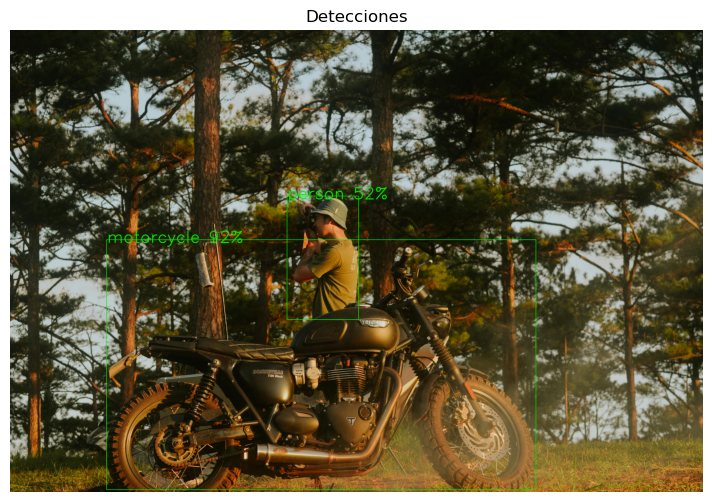

In [34]:
# Importamos las librerías necesarias
import cv2
import math
import matplotlib.pyplot as plt
from ultralytics import YOLO  # Asegúrate de que la librería está instalada

# Cargamos el modelo YOLO preentrenado
model = YOLO("yolo11n.pt")  # Sustituye por la ruta al modelo si está en otra ubicación

# Configuración de los parámetros de dibujo
font = cv2.FONT_HERSHEY_SIMPLEX  # Tipo de fuente para el texto
fontScale = 4.7  # Tamaño de la fuente
color = (0, 240, 0)  # Color del texto y el rectángulo (en formato BGR)
thickness = 8  # Grosor del rectángulo y del texto

# Cargamos la imagen desde la ruta especificada
img = cv2.imread('moto.jpg')

# Realizamos la predicción sobre la imagen utilizando el modelo YOLO
results = model(img)

# Procesamos los resultados de las predicciones
for r in results:  # Iteramos sobre los resultados
    for box in r.boxes:  # Iteramos sobre cada cuadro detectado
        # Coordenadas del cuadro delimitador
        x1, y1, x2, y2 = box.xyxy[0]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

        # Obtenemos la confianza de la predicción y la redondeamos al entero más cercano
        confidence = math.ceil((box.conf[0] * 100))

        # Dibujamos el cuadro delimitador en la imagen
        cv2.rectangle(img, (x1, y1), (x2, y2), color, 4)

        # Colocamos la etiqueta con el nombre de la clase y la confianza
        label = r.names[int(box.cls[0])] + " " + str(confidence) + "%"
        cv2.putText(img, label, (x1 + 4, y1 + 25), font, fontScale, color, thickness)

# Convertimos la imagen de BGR (formato OpenCV) a RGB (formato matplotlib)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Mostramos la imagen con matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(img_rgb)
plt.axis('off')  # Ocultamos los ejes para una visualización más limpia
plt.title("Detecciones")
plt.show()


In [ ]:
# Importamos la librería necesaria de ultralytics para trabajar con modelos YOLO
import ultralytics

# Definimos la tarea que vamos a realizar, en este caso detección de objetos con entrenamiento

# Se inicia el entrenamiento con el comando de la siguiente manera:

ultralytics.YOLO('yolo11s').train(
    task='detect',  # Tarea de detección de objetos
    mode='train',   # Modo de entrenamiento
    epochs=50,      # Número de épocas para el entrenamiento
    batch=10,       # Tamaño del batch de datos
    model='yolo11s', # Modelo YOLO preentrenado a usar
    data='/home/usuario/yolo/train_ships/data.yaml'  # Ruta al archivo de configuración de datos
)

# A continuación, se explica la estructura del archivo data.yaml y sus componentes:

# Carpeta donde encontrará las imágenes de entrenamiento
# path: /home/usuario/yolo/train_ships

# Carpeta con las imágenes de entrenamiento
# train: ./train/images

# Carpeta con las imágenes de validación (Usadas para entrenar y sacar métricas)
# val: ./valid/images

# Carpeta con las imágenes de test (No usadas para entrenar y solo para sacar métricas)
# test: ./test/images

# Número total de clases (Tipos de objeto que el modelo debe detectar)
# nc: 43

# Nombres de cada clase que el modelo detectará
# names: ['A10', 'A400M', 'AG600', 'AV8B', 'B1', 'B2', 'B52', 'Be200', 'C130', 'C17', 'C2', 'C5', 'E2', 'E7', 'EF2000', 
#         'F117', 'F14', 'F15', 'F16', 'F18', 'F22', 'F35', 'F4', 'J20', 'JAS39', 'MQ9', 'Mig31', 'Mirage2000', 'P3', 'RQ4', 
#         'Rafale', 'SR71', 'Su34', 'Su57', 'Tornado', 'Tu160', 'Tu95', 'U2', 'US2', 'V22', 'Vulcan', 'XB70', 'YF23']

# Por cada carpeta de imágenes habrá dos subcarpetas ('images' y 'labels').
# La primera contendrá todas las imágenes, y la segunda las etiquetas.
# En la carpeta de etiquetas, habrá un archivo 'txt' por cada imagen, con el mismo nombre de la imagen.
# Cada archivo de texto indicará las clases que contiene la imagen y sus coordenadas (especificadas como porcentajes).
# Las coordenadas estarán en el formato: class_id center_x center_y width height
# (Donde center_x, center_y, width, height son los valores relativos a las dimensiones de la imagen, 
# en un rango de 0 a 1, es decir, se usan porcentajes).
# Es importante asegurarse de que todas las imágenes tengan el mismo tamaño y sean cuadradas (por ejemplo 640x640 o 320x320).


In [ ]:
import ultralytics
import matplotlib.pyplot as plt
import cv2

# Definir la ruta del modelo y la imagen de entrada
model_path = '/home/usuario/yolo/train_ships/runs/detect/train3/weights/best.pt'
image_path = '/home/usuario/yolo/train_ships/sample5.jpg'

# Realizar la predicción con el modelo
results = ultralytics.YOLO(model_path).predict(source=image_path, conf=0.35)

# Obtener la imagen predicha con las cajas y etiquetas
# `results.ims` contiene las imágenes procesadas por el modelo
img_result = results.ims[0]

# Convertir la imagen de BGR a RGB (OpenCV usa BGR por defecto)
img_result_rgb = cv2.cvtColor(img_result, cv2.COLOR_BGR2RGB)

# Mostrar la imagen utilizando Matplotlib
plt.figure(figsize=(10,10))
plt.imshow(img_result_rgb)
plt.axis('off')  # Desactivar los ejes para mejor visualización
plt.show()



In [ ]:
# Importamos las librerías necesarias
import cv2  # Librería para el procesamiento de imágenes y vídeo
import math  # Librería para realizar operaciones matemáticas, como el redondeo
import ultralytics  # Librería para trabajar con modelos YOLO de la compañía Ultralytics

# Cargamos el modelo YOLO preentrenado
model = ultralytics.YOLO("yolo11x.pt")  # Reemplaza por el nombre correcto del archivo del modelo

# Configuración de la cámara
cap = cv2.VideoCapture(0)  # Inicializa la captura de vídeo desde la cámara (0 es la cámara predeterminada)

# Parámetros para el texto y el dibujo de los rectángulos
font = cv2.FONT_HERSHEY_SIMPLEX  # Tipo de fuente para el texto
fontScale = 0.7  # Escala del tamaño de la fuente
color = (0, 250, 0)  # Color de la fuente y el rectángulo (en formato BGR)
thickness = 2  # Grosor del rectángulo y del texto

# Bucle para capturar imágenes de la cámara y procesarlas
while True:
    success, img = cap.read()  # Lee una imagen de la cámara
    results = model(img, stream=True)  # Pasa la imagen al modelo YOLO para que realice las predicciones

    # Iteramos sobre los resultados de las predicciones
    for r in results:  # Iteramos sobre los resultados (pueden haber múltiples resultados de predicción)
        for box in r.boxes:  # Iteramos sobre las cajas de los objetos detectados
            # Extraemos las coordenadas de la caja delimitadora de cada objeto detectado
            x1, y1, x2, y2 = box.xyxy[0]
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

            # Calculamos el nivel de confianza de la predicción
            confidence = math.ceil((box.conf[0] * 100))  # Multiplicamos por 100 para obtener el porcentaje

            # Dibujamos el rectángulo alrededor del objeto
            cv2.rectangle(img, (x1, y1), (x2, y2), color, 1)  # Rectángulo de la predicción

            # Escribimos el nombre del objeto y el porcentaje de confianza sobre la imagen
            cv2.putText(img, r.names[int(box.cls[0])] + " " + str(confidence) + "%",
                        [x1 + 4, y1 + 25], font, fontScale, color, thickness)

    # Mostramos la imagen procesada en la ventana
    cv2.imshow('Webcam', img)

    # Si presionamos 'q', salimos del bucle
    if cv2.waitKey(1) == ord('q'):
        break

# Liberamos el dispositivo de captura y cerramos las ventanas
cap.release()  # Libera la cámara
cv2.destroyAllWindows()  # Cierra todas las ventanas de OpenCV
